**INSTALAÇÃO DE PACKAGES**

In [52]:
!pip install keybert
!pip install -U scikit-learn

In [53]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [54]:
!pip install scikit-learn==0.24.2

  Using cached scikit-learn-0.24.2.tar.gz (7.5 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  error: subprocess-exited-with-error
  
  × Preparing metadata (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (pyproject.toml) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [55]:
!pip install nltk
!pip install rake-nltk
!pip install spacy
!python -m spacy download pt_core_news_md
!pip install gensim
!pip install rank_bm25
!pip install optuna
!pip install xlsxwriter

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 MB 8.8 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('pt_core_news_md')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


**DEFINIÇÃO DE VARIÁVEIS E PRÉ-PROCESSAMENTO**

In [56]:
#Bibliotecas
import pandas as pd
from keybert import KeyBERT
from sentence_transformers import SentenceTransformer
from sklearn import metrics
from sklearn.cluster import DBSCAN, KMeans
import pickle
import nltk
import os
import spacy
import numpy as np
import statistics
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import matplotlib.cm as cm


nltk.download("stopwords")
nltk.download('punkt')

#Português
MODEL_ML = "paraphrase-multilingual-MiniLM-L12-v2"
#MODEL_ML = "rufimelo/bert-large-portuguese-cased-sts"
stopwords = nltk.corpus.stopwords.words("portuguese")

#Inglês
#MODEL_ML = "all-MiniLM-L6-v2"
#stopwords = nltk.corpus.stopwords.words("english")

threshold = [0, 0.05, 0.1, 0.2]


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [57]:
def normalize_dataset(df_initial, regex=None, removeGreetings=None, speaker=None):
    """Normalize turn_id by (all turn_id's/max turn_id) and some column names."""
    df = df_initial.copy()

    # Padrões para substituição
    url_pattern = r"https?://\S+"
    url_placeholder = "xURLx"
    user_tags_pattern = "@\\S+"
    user_tags_placeholder = "xUSERNAMEx"

    #Renomear as colunas
    if "text" in df.columns:
        df.rename(columns={"text": "utterance"}, inplace=True)

    if "Utterance" in df.columns:
        df.rename(columns={"Utterance": "utterance"}, inplace=True)

    if "transcript" in df.columns:
        df.rename(columns={"transcript": "utterance"}, inplace=True)

    if "Msg" in df.columns:
        df.rename(columns={"Msg": "utterance"}, inplace=True)

    if "intent_title" in df.columns:
        df.rename(columns={"intent_title": "trueLabel"}, inplace=True)

    if "dialog_act" in df.columns:
        df.rename(columns={"dialog_act": "trueLabel"}, inplace=True)

    if "dialogue_act" in df.columns:
        df.rename(columns={"dialogue_act": "trueLabel"}, inplace=True)

    if "intents" in df.columns:
        df.rename(columns={"intents": "trueLabel"}, inplace=True)

    if "speaker" in df.columns:
        df.rename(columns={"speaker": "Speaker"}, inplace=True)

    if "user" in df.columns:
        df.rename(columns={"user": "Speaker"}, inplace=True)

    if "interlocutor" in df.columns:
        df.rename(columns={"interlocutor": "Speaker"}, inplace=True)

    if "trueLabel" in df.columns:
        df["trueLabel"] = df["trueLabel"].replace(" ", "_", regex=True)

    if 'trueLabel' in df.columns:
        df['utterance']= df['utterance'].apply(lambda x: x.lower())

    if 'trueLabel' in df.columns:
        df.trueLabel = df.trueLabel.fillna('none')

    # Substituição de padrões usando expressões regulares
    if regex is True:
        df["utterance"] = df["utterance"].replace(
            to_replace=url_pattern, value=url_placeholder, regex=True
        )
        df["utterance"] = df["utterance"].replace(
            to_replace=user_tags_pattern, value=user_tags_placeholder, regex=True
        )

    if speaker == "both":
        df = df

    if 'Speaker' in df.columns:
        df['Speaker'] = df['Speaker'].replace('USR', 'USER')
        df['Speaker'] = df['Speaker'].replace('Cliente', 'USER')
        df['Speaker'] = df['Speaker'].replace('SERVICE', 'SYSTEM')
        df['Speaker'] = df['Speaker'].replace('SYS', 'SYSTEM')
        df['Speaker'] = df['Speaker'].replace('Automaise', 'SYSTEM')

    df['Speaker'] = df['Speaker'].str.strip()

    # Criação de 'dialogue_id' com base no 'turn_id'
    if 'dialogue_id' not in df.columns and 'turn_id' in df.columns:
        dialog = 0
        result = []
        i_anterior = -1
        for i in df['turn_id']:
            if i_anterior == -1 or i > i_anterior:
                i_anterior = i
            else:
                dialog = dialog + 1
                i_anterior = -1
            result.append(dialog)
        df['dialogue_id'] = result
    # Criação de 'turn_id' com base no 'dialogue_id'
    if 'turn_id' not in df.columns and 'dialogue_id' in df.columns:
        df['turn_id'] = df.groupby('dialogue_id').cumcount()

    #create variable which is a incremental sequence by number of utterances
    df['sequence'] = [i for i in range(len(df))]

    return df


In [58]:
#Silhouette Score
def silhouette_method(data, min_k, max_k, incr):
    number_clusters = 0
    atual_silhouette = 0.000
    # Prepare the scaler
    scale = StandardScaler().fit(data)

    # Fit the scaler
    scaled_data = pd.DataFrame(scale.fit_transform(data))

    # Para o método de silhouette, k precisa começar a partir de 2
    n_clusters_axis = range(min_k, max_k, incr)
    silhouettes = []

    # Ajustar o modelo
    for k in n_clusters_axis:
        kmeans = KMeans(n_clusters=k, init="k-means++", random_state=2)
        kmeans.fit(scaled_data)
        score = metrics.silhouette_score(scaled_data, kmeans.labels_)
        silhouettes.append(score)
        if score > atual_silhouette:
            number_clusters = k
            atual_silhouette = score

    #Gerar o grafo de dispersão
    scatter_plot = sns.scatterplot(
        x=n_clusters_axis, y=silhouettes)

    #Usa a função get_figure e armazena o gráfico em uma variável (scatter_fig)
    scatter_fig = scatter_plot.get_figure()

    # Guarda p gráfico
    scatter_fig.savefig('scatterplot.png')

    return number_clusters

In [59]:
def use_sentence_transformer(sentences, model):
    # as frases são codificadas chamando model.encode()
    embeddings = model.encode(sentences)
    vectors = np.array(embeddings)
    return vectors

In [60]:
# Função para treinar o modelo KMeans e guardar os resultados num arquivo pickle
def clustering_kmeans(vectors, n_clusters, nomeFichPickle, max_iters=1000):
    # Verifica se o modelo KMeans já foi treinado e guardado
    if not os.path.exists(nomeFichPickle):
        # Se o modelo ainda não foi treinado, executa o KMeans
        kmeans = KMeans(n_clusters=n_clusters, init="k-means++", max_iter=max_iters, random_state=2)
        kmeans.fit(vectors)

        labels_kmeans = kmeans.labels_
        centers_kmeans = kmeans.cluster_centers_

        # print das métricas de avaliação interna para KMeans
        print("\nInternal Evaluation:\nSilhouette Score: ", metrics.silhouette_score(vectors, labels_kmeans))
        print("Davies-Bouldin Index (DBI): ", metrics.davies_bouldin_score(vectors, labels_kmeans))

        # Guarda o modelo KMeans treinado num ficheiro pickle
        with open(nomeFichPickle, 'wb') as file:
            pickle.dump((labels_kmeans, centers_kmeans), file)
    else:
        # Se o modelo já foi treinado e salvo, carrega-o do arquivo pickle
        with open(nomeFichPickle, 'rb') as file:
            labels_kmeans, centers_kmeans = pickle.load(file)

    return labels_kmeans, centers_kmeans


**LABELLING DOS CLUSTERS**

In [61]:
def describe_clusters_kBERT(n_clusters, y_predicted, normalized_df, model, stopwords, n_grams, n_entries):
    # Inicializa o modelo KeyBERT
    kw_model = KeyBERT(model=model)

    # Cria um DataFrame vazio para armazenar as labels do cluster e palavras-chave do kBERT
    df_teste = normalized_df.copy()
    df_teste["predicted"] = y_predicted
    df_teste["utterance"] = df_teste["utterance"].astype(str)

    # Lista para armazenar as labels do cluster e palavras-chave do kBERT
    list_kBERT = []
    list_clusters = []  # clusters

    # ids dos clusters, por ordem crescente
    cluster_ids = sorted(list(set(y_predicted)))

    # Percorre os clusters
    for cluster_id in range(n_clusters):
        predicted_df = df_teste[df_teste["predicted"] == cluster_id]
        corpus = predicted_df['utterance']

        corpus = [str(c) for c in corpus]
        #print(corpus)

        # Extrai palavras-chave - KeyBERT
        keywords = kw_model.extract_keywords(" ".join(corpus), keyphrase_ngram_range=(1, n_grams), stop_words=stopwords, highlight=False, top_n=n_entries)
        #print("keywords", keywords)

        # Remove duplicados das palavras-chave
        keywords_list = [w[0] for w in keywords]
        keywords_set = set(keywords_list)
        keywords_list = list(keywords_set)

        # Adiciona "Outros {cluster_id}" se a lista de palavras-chave estiver vazia
        if not keywords:
            keywords = [(f"Outros {cluster_id}", 1.0)]

        print(f"Cluster {cluster_id} - Keywords: {keywords}")

        # Armazena apenas as palavras-chave e não os scores
        keywords_list = [w[0] for w in keywords]
        list_kBERT.append(keywords_list)
        list_clusters.append(f"Cluster {cluster_id}")

    # Cria DataFrames a partir das listas e concatena-os
    df1 = pd.DataFrame(list_clusters, columns=["clusters"])
    df2 = pd.DataFrame(list_kBERT, columns=["labels"])
    df_labels = pd.concat([df1, df2], axis=1)

    print(df_labels)
    return df_labels


**GUARDAR NO EXCEL**

In [62]:
def save_to_excel(output_file, role, metric, clusters, n_clusters, create_new_sheet=True):
    # Cria um DataFrame
    data = {
        'Role': [role],
        'Metric': [metric],
        #'Parameters': [str(params)],
        #'Silhouette Score': [silhouette],
        'Clusters': [clusters],
        'N_Clusters': [n_clusters]
    }

    df = pd.DataFrame(data)

    # Tenta ler o arquivo Excel existente, se não existir, cria um novo
    try:
        existing_df = pd.read_excel(output_file, sheet_name='results')
        df = pd.concat([existing_df, df], ignore_index=True)
    except FileNotFoundError:
        pass

    # Adiciona ou cria uma nova folha
    with pd.ExcelWriter(output_file, engine='xlsxwriter') as writer:
        if create_new_sheet or 'results' not in writer.sheets:
            df.to_excel(writer, sheet_name='results', index=False)
        else:
            df.to_excel(writer, sheet_name='results', index=False, startrow=len(existing_df)+1)

**REPRESENTAÇÃO**

In [63]:
# DATA
filename = "dialogues_001_MultiWOZ-PT_DAs_512_treino_com_sentimento_FINAL.xlsx"
#dados = pd.read_csv(filename, sep=';')
dados = pd.read_excel(filename)
#tirar caracteres estranhos
#dados['utterance'] = dados['utterance'].apply(lambda x: x.encode('latin1').decode('utf-8', 'ignore'))

#ENTIDADES -> Twitter
#dados = dados[dados['Acc_Query'].str.contains('RTP')]
#dados = dados.loc[dados['Acc_Query'] == 'VODAFONE']

#Entidades Telecom
#entidades = ['MEO', 'VODAFONE', 'NOWO', 'ALTICE']
#dados = dados.loc[dados['Acc_Query'].isin(entidades)]

#Entidades TV
#dados = dados[dados['Acc_Query'].isin(['Netflix']) | dados['Acc_Query'].str.contains('RTP')]
#dados['Acc_Query'] = dados['Acc_Query'].str.upper()

normalized_df = normalize_dataset(dados, regex=True, removeGreetings=False, speaker='both')
normalized_df_user = normalized_df[normalized_df['Speaker'] == 'USER']
normalized_df_system = normalized_df[normalized_df['Speaker'] == 'SYSTEM']
utterances_user = normalized_df_user["utterance"].tolist()
utterances_system = normalized_df_system["utterance"].tolist()

In [64]:
#USAR O MODELO RUFIMELO
from transformers import AutoTokenizer, AutoModel
import torch

if MODEL_ML == 'rufimelo/bert-large-portuguese-cased-sts':
  # Carregar o tokenizador e o modelo
  tokenizer = AutoTokenizer.from_pretrained(MODEL_ML)
  model = AutoModel.from_pretrained(MODEL_ML)

  # Tokenizar as frases
  inputs_user = tokenizer(utterances_user, return_tensors="pt", padding=True, truncation=True)
  inputs_system = tokenizer(utterances_system, return_tensors="pt", padding=True, truncation=True)

  # Obter os embeddings do modelo BERT
  with torch.no_grad():  # Desativa o cálculo do gradiente para economizar memória
      outputs_user = model(**inputs_user)
      outputs_system = model(**inputs_system)

  # Extrair os embeddings da camada oculta
  # Usamos a última camada do modelo BERT, e pegamos o vetor [CLS]
  # que geralmente representa a frase como um todo
  vectors_user = outputs_user.last_hidden_state[:, 0, :]  # Vetores para cada frase do USER
  vectors_system = outputs_system.last_hidden_state[:, 0, :]  # Vetores para cada frase do SYSTEM

#Dimensão dos vetores USER E SYSTEM
#print(vectors_user.shape)
#print(vectors_system.shape)

In [65]:
# EMBEDDING
model_ml = SentenceTransformer(MODEL_ML)
#vectors = use_sentence_transformer(utterances, model_ml)
vectors_user = use_sentence_transformer(utterances_user, model_ml)
vectors_system = use_sentence_transformer(utterances_system, model_ml)

**CLUSTERING W/ KMEANS - OTIMIZAÇÃO DA SILHOUETTE E V-MEASURE**

In [66]:
import optuna
from sklearn.cluster import AgglomerativeClustering, DBSCAN

#Está preparado para silhouette, v-measure e NONE
metric_to_optimize = "vmeasure"
n_trials = 5

#CLUSTERING -> K-MEANS COM SILHOUETTE SCORE
def objective_kmeans_silhouette(trial, vectors):
    n_clusters = trial.suggest_int('n_clusters', 3, 10)
    init_method = trial.suggest_categorical('init_method', ['k-means++', 'random'])
    n_init = trial.suggest_int('n_init', 1, 30)
    tol = trial.suggest_float('tol', 1e-4, 1e-1, log=True)
    algorithm = trial.suggest_categorical('algorithm', ['lloyd', 'elkan'])

    kmeans = KMeans(
        n_clusters=n_clusters,
        init=init_method,
        n_init=n_init,
        tol=tol,
        algorithm=algorithm,
        random_state=2
    )
    kmeans.fit(vectors)

    silhouette = metrics.silhouette_score(vectors, kmeans.labels_)
    return silhouette


def clustering_kmeans_silhouette_optuna(vectors, role, metric, nomeFichPickle):
    labels_kmeans = None
    centers_kmeans = None
    silhouette_kmeans = None
    n_clusters = None
    best_params = None
    parameters_trial = None

    # Se o modelo já foi treinado e salvo, carrega-o do ficheiro pickle
    if os.path.exists(nomeFichPickle):
        with open(nomeFichPickle, 'rb') as file:
            data = pickle.load(file)
            labels_kmeans, centers_kmeans, params, silhouette_kmeans = data.get('labels'), data.get('centers'), data.get('params'), data.get('silhouette')
        print(f"Modelo já existente para {role}. Carregando os resultados salvos.")
        print(f"Hiperparâmetros carregados do pickle para {role}: {params}")
        print(f"Melhor {metric} Score carregado do pickle para {role}: {silhouette_kmeans}")

        if params is not None:
            n_clusters = params['n_clusters']
    else:
        # Se o ficheiro pickle não existe, aplica o optuna

        #study = optuna.create_study(direction="maximize")  # Queremos o melhor silhouette
        objective_func = lambda trial: objective_kmeans_silhouette(trial, vectors)
        study.optimize(objective_func, n_trials=n_trials)

        best_trial = study.best_trial  # Obtém a melhor tentativa

        best_params = best_trial.params
        n_clusters = best_params['n_clusters']
        init = best_params['init_method']
        n_init = best_params['n_init']
        tol = best_params['tol']
        algorithm = best_params['algorithm']

        parameters_trial = {
            'n_clusters': n_clusters,
            'init_method': init,
            'n_init': n_init,
            'tol': tol,
            'algorithm': algorithm
        }

        kmeans = KMeans(n_clusters=n_clusters, init=init, n_init=n_init, tol=tol, algorithm=algorithm, random_state=2)
        kmeans.fit(vectors)

        silhouette_kmeans = metrics.silhouette_score(vectors, kmeans.labels_)

        # Guarda todos os resultados no arquivo pickle
        with open(nomeFichPickle, 'wb') as file:
            pickle.dump({'labels': kmeans.labels_, 'centers': centers_kmeans, 'params': best_params, 'silhouette': silhouette_kmeans}, file)

        print(f"Melhores parâmetros encontrados para {role} na Função Silhouette:")
        print(best_params)
        print(f"Melhor Silhouette para {role}: {silhouette_kmeans}")

        labels_kmeans, centers_kmeans = kmeans.labels_, kmeans.cluster_centers_

    return labels_kmeans, centers_kmeans, silhouette_kmeans, n_clusters, best_params

In [67]:
import math
from collections import Counter
from optuna.storages import RDBStorage

#count_acts = normalized_df.groupby('trueLabel')['sequence'].agg(lambda x: x.count())
#print("count_acts", count_acts)

# Todas as combinações únicas de intents
#unique_combinations = normalized_df['trueLabel'].unique()
#print("Combinações ou intents/DAs únicos:", unique_combinations)
#num_unique_combinations = len(unique_combinations)  #
#print("Quantas Combinações ou intents/DAs únicos: ", num_unique_combinations)

# Contagem de cada combinação única de intents
#intents_count = normalized_df['trueLabel'].value_counts()

# Contagens para cada combinação de intents
#print("Contagem para cada combinação de intents/DAs:")
#print(intents_count)

# Num total de combinações únicas
#num_unique_combinations = len(intents_count)
#print("Número total de combinações únicas:", num_unique_combinations)

#PARA DIALOGUE ACTS

def objective_kmeans_vmeasure(trial, vectors, normalized_df):
    # Defino os parâmetros do KMeans a serem otimizados
    n_clusters = trial.suggest_int('n_clusters', 3, 10)
    init_method = trial.suggest_categorical('init_method', ['k-means++', 'random'])
    tol = trial.suggest_float('tol', 1e-4, 1e-1, log=True)
    algorithm = trial.suggest_categorical('algorithm', ['lloyd', 'elkan'])

    # Configurar kmeans
    kmeans = KMeans(
        n_clusters=n_clusters,
        init=init_method,
        max_iter=1000,
        tol=tol,
        algorithm=algorithm,
        random_state=2
    )
    kmeans.fit(vectors)

    true_labels = []
    pred_labels = []

    for idx in range(len(kmeans.labels_)):
        # Obter o valor da coluna trueLabel para o índice idx
        true_label_entry = normalized_df.iloc[idx]['trueLabel']

        # Verificar se true_label_entry é uma string válida
        if isinstance(true_label_entry, str):
            utterance_true_labels = true_label_entry.split(',')
        else:
            raise ValueError(f"O 'trueLabel' na linha {idx} não está no formato esperado.")

        cluster_label = kmeans.labels_[idx]

        true_labels.extend(utterance_true_labels)
        pred_labels.extend([cluster_label] * len(utterance_true_labels))

    # Calcular as métricas
    v_measure = metrics.v_measure_score(true_labels, pred_labels, beta=1.0)
    silhouette_score = metrics.silhouette_score(vectors, kmeans.labels_)
    adjusted_rand_score = metrics.adjusted_rand_score(true_labels, pred_labels)
    completeness_score = metrics.completeness_score(true_labels, pred_labels)
    homogeneity_score = metrics.homogeneity_score(true_labels, pred_labels)
    calinski_harabasz_score = metrics.calinski_harabasz_score(vectors, kmeans.labels_)
    davies_bouldin_score = metrics.davies_bouldin_score(vectors, kmeans.labels_)

    # Adicionar os valores calculados aos atributos do trial
    trial.set_user_attr(key='v_measure', value=float(v_measure))
    trial.set_user_attr(key='silhouette_score', value=float(silhouette_score))
    trial.set_user_attr(key='adjusted_rand_score', value=float(adjusted_rand_score))
    trial.set_user_attr(key='completeness_score', value=float(completeness_score))
    trial.set_user_attr(key='homogeneity_score', value=float(homogeneity_score))
    trial.set_user_attr(key='calinski_harabasz_score', value=float(calinski_harabasz_score))
    trial.set_user_attr(key='davies_bouldin_score', value=float(davies_bouldin_score))

    print(f"Trial {trial.number}:")
    print(f"  Silhouette Score: {silhouette_score}")
    print(f"  V-Measure: {v_measure}")
    print(f"  Adjusted Rand Score: {adjusted_rand_score}")
    print(f"  Completeness Score: {completeness_score}")
    print(f"  Homogeneity Score: {homogeneity_score}")
    print(f"  Calinski-Harabasz Score: {calinski_harabasz_score}")
    print(f"  Davies-Bouldin Score: {davies_bouldin_score}")

    return v_measure


def clustering_kmeans_vmeasure_optuna(vectors, normalized_df, role, nomeFichPickle):
    labels_kmeans = None
    centers_kmeans = None
    n_clusters = None
    study = None

    # Configurar a base de dados para armazenar trials
    storage_path = "sqlite:///optuna_studies.db"
    storage = RDBStorage(storage_path)

    # Se o ficheiro pickle não existe, aplicar o optuna
    if os.path.exists(nomeFichPickle):
        with open(nomeFichPickle, 'rb') as file:
            kmeans = pickle.load(file)
            print("kmeans", kmeans)
            labels_kmeans = kmeans['labels']
        print(f"Modelo já existente para {role}. Carregando os resultados salvos.")
    else:
        study_name = f"study_{role}"

        study = optuna.create_study(
            study_name=study_name,
            storage=storage,
            load_if_exists=True,
            direction="maximize",
        )

        study.optimize(lambda trial: objective_kmeans_vmeasure(trial, vectors, normalized_df), n_trials=50)

        for trial in study.trials:
            n_clusters = trial.params['n_clusters']
            init = trial.params['init_method']
            tol = trial.params['tol']
            algorithm = trial.params['algorithm']

            kmeans = KMeans(n_clusters=n_clusters, init=init, tol=tol, algorithm=algorithm, random_state=2)
            kmeans.fit(vectors)

        with open(nomeFichPickle, 'wb') as file:
            pickle.dump(kmeans, file)

        labels_kmeans, centers_kmeans = kmeans.labels_, kmeans.cluster_centers_

    return labels_kmeans, centers_kmeans, n_clusters, study

In [68]:
print(normalized_df.columns)
print(normalized_df.head())


Index(['utterance', 'Speaker', 'turn_id', 'filename', 'first_dialogue_act',
       'Median_Binary', 'trueLabel', 'dialogue_id', 'sequence'],
      dtype='object')
                                           utterance Speaker  turn_id  \
0  preciso de reservas de comboios de fátima para...    USER        0   
1  tenho 85 comboios que correspondem ao seu pedi...  SYSTEM        1   
2  gostaria de partir na segunda-feira e chegar a...    USER        2   
3  há 9 comboios para o dia e hora que solicita. ...  SYSTEM        3   
4  antes de reservar, gostaria também de saber o ...    USER        4   

       filename first_dialogue_act  Median_Binary         trueLabel  \
0  MUL0484.json             Inform              1            Inform   
1  MUL0484.json             Inform              1    Inform,Request   
2  MUL0484.json             Inform              1            Inform   
3  MUL0484.json             Inform              1  Inform,OfferBook   
4  MUL0484.json            Request         

In [69]:
import time
import joblib

excel_user = 'k_means_output_user.xlsx'
excel_sys = 'k_means_output_sys.xlsx'

def create_clusters_dic(y_predicted, utterances, label):
    clusters_dic = {}  # cluster id -> utterances
    for i, u in enumerate(utterances):
        cid = y_predicted[i]
        if cid not in clusters_dic:
            clusters_dic[cid] = []
        clusters_dic[cid].append(u)

    # Selecionar apenas as 10 primeiras utterances de cada cluster
    clusters_dic = {k: v for k, v in clusters_dic.items()}

    n_clusters = 0
    for k, v in clusters_dic.items():
        n_clusters += 1
        #print(f"Cluster {k} ({label}): {v}")


    return clusters_dic

if metric_to_optimize == 'vmeasure':
  #CLUSTERING PARA USER

  nomeFichPickleUser = f"k_means_mu3332434444343226i3523333.pkl"
  nomeFichPickleSystem = f"k_means_mu33324423244332633533433223.pkl"

  study_user = None
  study_system = None
  clusters_user_v_measure_list = []
  studies = []
  accuracy = None

  # K-means para o papel de USER
  y_predicted_user, centers_user, n_clusters_user, study_user = clustering_kmeans_vmeasure_optuna(vectors_user, normalized_df_user, role='User', nomeFichPickle=nomeFichPickleUser)

  clusters_user_v_measure_list = []  # Lista para armazenar clusters de cada trial

  # Cria uma cópia do DataFrame para atualizar iterativamente
  normalized_df_user_trial = normalized_df_user.copy()

  for trial_idx, trial in enumerate(study_user.trials, 1):  # Itera sobre os trials, começando no índice 1
      n_clusters = trial.params['n_clusters']
      init = trial.params['init_method']
      tol = trial.params['tol']
      algorithm = trial.params['algorithm']

      kmeans = KMeans(n_clusters=n_clusters, init=init, tol=tol, algorithm=algorithm, random_state=2)
      kmeans.fit(vectors_user)

      # Criar os clusters para este trial
      clusters_user_v_measure = create_clusters_dic(kmeans.labels_, utterances_user, f'User_trial{trial_idx}')

      # Adicionar os clusters deste trial à lista
      clusters_user_v_measure_list.append(clusters_user_v_measure)

      # Atualizar o DataFrame para o trial atual
      normalized_df_user_trial[f'cluster_user_trial{trial_idx}'] = kmeans.labels_
      #print(f"normalized_df_user_trial{trial_idx}", normalized_df_user_trial)

      with open(nomeFichPickleUser, 'ab') as file:
          pickle.dump(clusters_user_v_measure, file)
          save_to_excel(excel_user, role='User', metric=metric_to_optimize, clusters=clusters_user_v_measure, n_clusters=n_clusters_user)

  # K-means para o papel de SYS
  y_predicted_system, centers_system, n_clusters_system, study_system = clustering_kmeans_vmeasure_optuna(vectors_system, normalized_df_system, role='System', nomeFichPickle=nomeFichPickleSystem)

  clusters_system_v_measure_list = []  # Lista para armazenar clusters de cada trial

  # Cria uma cópia do DataFrame para atualizar iterativamente
  normalized_df_system_trial = normalized_df_system.copy()

  for trial_idx, trial in enumerate(study_system.trials, 1):  # Itera sobre os trials, começando do índice 1
      n_clusters = trial.params['n_clusters']
      init = trial.params['init_method']
      tol = trial.params['tol']
      algorithm = trial.params['algorithm']

      kmeans = KMeans(n_clusters=n_clusters, init=init, tol=tol, algorithm=algorithm, random_state=2)
      kmeans.fit(vectors_system)

      # Criar os clusters para este trial
      clusters_system_v_measure = create_clusters_dic(kmeans.labels_, utterances_system, f'System_trial{trial_idx}')

      # Adicionar os clusters deste trial à lista
      clusters_system_v_measure_list.append(clusters_system_v_measure)

      # Atualizar o DataFrame para o trial atual
      normalized_df_system_trial[f'cluster_system_trial{trial_idx}'] = kmeans.labels_
      #print(f"normalized_df_system_trial{trial_idx}", normalized_df_system_trial)

      with open(nomeFichPickleSystem, 'ab') as file:
          pickle.dump(clusters_system_v_measure, file)
          save_to_excel(excel_sys, role='System', metric=metric_to_optimize, clusters=clusters_system_v_measure, n_clusters=n_clusters_system)

  # Combina os DataFrames finais após todos os trials
  df_final_user = normalized_df_user_trial
  df_final_system = normalized_df_system_trial
  df_final = pd.concat([df_final_user, df_final_system])
  #print("df_final", df_final)

  # Adicionar trials à lista
  studies.extend([study_user, study_system])

#SILHOUETTE SCORE

elif metric_to_optimize == 'silhouette':
  #CLUSTERING PARA USER
  nomeFichPickleUser_silh = 'k_means_multiwozpt_net_silh.pkl'
  nomeFichPickleUser_silh_utterances = 'k_means_multiwozpt_net_utt.pkl'
  #nomeFichPickleUser_maxim = 'kmeans_user_nova_metrica_twittere12e43e54.pkl'

  #K-means
  #Silhouette
  y_predicted_user, centers_user, silhouette_user, n_clusters_user, params_user = clustering_kmeans_silhouette_optuna(vectors_user, role='User', metric='Silhouette', nomeFichPickle=nomeFichPickleUser_silh)

  if os.path.exists(nomeFichPickleUser_silh_utterances):
          with open(nomeFichPickleUser_silh_utterances, 'rb') as file:
              data = pickle.load(file)
              for k, v in data.items():
                  print(f"Cluster {k} ({'User'}): {v}")
  else:
      clusters_user_silhouette = create_clusters_dic(y_predicted_user, utterances_user, 'User')
      with open(nomeFichPickleUser_silh_utterances, 'wb') as file:
          pickle.dump(clusters_user_silhouette, file)
      save_to_excel(excel_user, role='User', metric='Silhouette', params=params_user, silhouette=silhouette_user, clusters=clusters_user_silhouette)

  #CLUSTERING PARA SYSTEM
  nomeFichPickleSystem_silh = 'k_means_multiwozpt_net_utt_sys.pkl'
  nomeFichPickleSystem_silh_utterances = 'k_means_multiwozpt_net_silh_sys.pkl'

  #K-means
  y_predicted_system, centers_system, silhouette_sys, n_clusters_system, params_sys = clustering_kmeans_silhouette_optuna(vectors_system, role='System', metric='Silhouette', nomeFichPickle=nomeFichPickleSystem_silh)

  if os.path.exists(nomeFichPickleSystem_silh_utterances):
          with open(nomeFichPickleSystem_silh_utterances, 'rb') as file:
              data = pickle.load(file)
              for k, v in data.items():
                  print(f"Cluster {k} ({'System'}): {v}")
  else:
      clusters_system_silhouette = create_clusters_dic(y_predicted_system, utterances_system, 'System')
      with open(nomeFichPickleSystem_silh_utterances, 'wb') as file:
          pickle.dump(clusters_system_silhouette, file)
      save_to_excel(excel_sys, role='System', metric='Silhouette', params=params_sys, silhouette=silhouette_sys, clusters=clusters_system_silhouette)

#-------------------------------------------------------------- V-MEASURE ------------------------------------------

#-------------------------------------------------------------- NONE ------------------------------------------

elif metric_to_optimize == 'NONE':
  nomeFichPickleUser = 'kmeans_user_TWITTER_VODAFONE.pkl'
  nomeFichPickleSystem = 'kmeans_System_TWITTER_VODAFONE.pkl'
  n_clusters_user = 8
  n_clusters_system = 8
  y_predicted_user, centers_user = clustering_kmeans(vectors_user, n_clusters_user, nomeFichPickleUser)
  y_predicted_system, centers_system = clustering_kmeans(vectors_system, n_clusters_system, nomeFichPickleSystem)
  clusters_user_none, n_clusters_user = create_clusters_dic(y_predicted_user, utterances_user, 'User')
  clusters_system_none, n_clusters_system = create_clusters_dic(y_predicted_system, utterances_system, 'System')


[I 2024-07-02 09:45:11,695] A new study created in RDB with name: study_User
[I 2024-07-02 09:45:13,120] Trial 0 finished with value: 0.29908192620765967 and parameters: {'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.0037052986374098112, 'algorithm': 'lloyd'}. Best is trial 0 with value: 0.29908192620765967.


Trial 0:
  Silhouette Score: 0.11728227883577347
  V-Measure: 0.29908192620765967
  Adjusted Rand Score: 0.12137690699158994
  Completeness Score: 0.22546140181486266
  Homogeneity Score: 0.44409273369009816
  Calinski-Harabasz Score: 241.87402464742016
  Davies-Bouldin Score: 2.704287789045968


[I 2024-07-02 09:45:14,751] Trial 1 finished with value: 0.23853045228887879 and parameters: {'n_clusters': 4, 'init_method': 'random', 'tol': 0.0003923104831385712, 'algorithm': 'elkan'}. Best is trial 0 with value: 0.29908192620765967.


Trial 1:
  Silhouette Score: 0.09695131331682205
  V-Measure: 0.23853045228887879
  Adjusted Rand Score: 0.127462228054404
  Completeness Score: 0.21357609567261984
  Homogeneity Score: 0.27008765242939714
  Calinski-Harabasz Score: 314.8602912998711
  Davies-Bouldin Score: 2.721593875150332


[I 2024-07-02 09:45:17,282] Trial 2 finished with value: 0.2774224199132049 and parameters: {'n_clusters': 6, 'init_method': 'random', 'tol': 0.00017273181951277372, 'algorithm': 'lloyd'}. Best is trial 0 with value: 0.29908192620765967.


Trial 2:
  Silhouette Score: 0.11936123669147491
  V-Measure: 0.2774224199132049
  Adjusted Rand Score: 0.13496863310026
  Completeness Score: 0.2216693619779139
  Homogeneity Score: 0.3706450139145522
  Calinski-Harabasz Score: 285.18229028274027
  Davies-Bouldin Score: 2.434215697965052


[I 2024-07-02 09:45:19,224] Trial 3 finished with value: 0.2798095845677087 and parameters: {'n_clusters': 6, 'init_method': 'k-means++', 'tol': 0.006936158337561969, 'algorithm': 'elkan'}. Best is trial 0 with value: 0.29908192620765967.


Trial 3:
  Silhouette Score: 0.11919989436864853
  V-Measure: 0.2798095845677087
  Adjusted Rand Score: 0.13703298302930564
  Completeness Score: 0.22350859052712516
  Homogeneity Score: 0.37402514704373985
  Calinski-Harabasz Score: 285.17412762247744
  Davies-Bouldin Score: 2.437751455585076


[I 2024-07-02 09:45:20,612] Trial 4 finished with value: 0.2991144466180073 and parameters: {'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.02183691668066147, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 4:
  Silhouette Score: 0.11727260053157806
  V-Measure: 0.2991144466180073
  Adjusted Rand Score: 0.12145214877228501
  Completeness Score: 0.22548889187326318
  Homogeneity Score: 0.44412948106164474
  Calinski-Harabasz Score: 241.87288047896052
  Davies-Bouldin Score: 2.7040671406397827


[I 2024-07-02 09:45:21,896] Trial 5 finished with value: 0.26192005934382273 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.0018550667999040096, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 5:
  Silhouette Score: 0.09291557967662811
  V-Measure: 0.26192005934382273
  Adjusted Rand Score: 0.09599056309723454
  Completeness Score: 0.19376720069216855
  Homogeneity Score: 0.4040264501629146
  Calinski-Harabasz Score: 224.51238047467334
  Davies-Bouldin Score: 2.6043903641452264


[I 2024-07-02 09:45:23,352] Trial 6 finished with value: 0.23853045228887879 and parameters: {'n_clusters': 4, 'init_method': 'random', 'tol': 0.00010919618351560378, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 6:
  Silhouette Score: 0.09695131331682205
  V-Measure: 0.23853045228887879
  Adjusted Rand Score: 0.127462228054404
  Completeness Score: 0.21357609567261984
  Homogeneity Score: 0.27008765242939714
  Calinski-Harabasz Score: 314.8602912998711
  Davies-Bouldin Score: 2.721593875150332


[I 2024-07-02 09:45:25,076] Trial 7 finished with value: 0.2724136775784128 and parameters: {'n_clusters': 7, 'init_method': 'random', 'tol': 0.00025858141717321565, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 7:
  Silhouette Score: 0.1220981553196907
  V-Measure: 0.2724136775784128
  Adjusted Rand Score: 0.11619874782167776
  Completeness Score: 0.2114555829653124
  Homogeneity Score: 0.38275318499174993
  Calinski-Harabasz Score: 261.92707707583565
  Davies-Bouldin Score: 2.4902058447397026


[I 2024-07-02 09:45:26,356] Trial 8 finished with value: 0.23953705890161942 and parameters: {'n_clusters': 4, 'init_method': 'random', 'tol': 0.06193556020416708, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 8:
  Silhouette Score: 0.09695461392402649
  V-Measure: 0.23953705890161942
  Adjusted Rand Score: 0.12633104104846002
  Completeness Score: 0.21444837459973984
  Homogeneity Score: 0.27127385378087987
  Calinski-Harabasz Score: 314.8398930345656
  Davies-Bouldin Score: 2.722098821572942


[I 2024-07-02 09:45:27,544] Trial 9 finished with value: 0.07323334029774299 and parameters: {'n_clusters': 3, 'init_method': 'k-means++', 'tol': 0.0016054286734599322, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 9:
  Silhouette Score: 0.06340648233890533
  V-Measure: 0.07323334029774299
  Adjusted Rand Score: -0.0816206051324319
  Completeness Score: 0.08036316289075711
  Homogeneity Score: 0.06726553932113112
  Calinski-Harabasz Score: 247.85030275914613
  Davies-Bouldin Score: 2.8966729537755973


[I 2024-07-02 09:45:28,817] Trial 10 finished with value: 0.24840738451809727 and parameters: {'n_clusters': 10, 'init_method': 'k-means++', 'tol': 0.0701072341506219, 'algorithm': 'elkan'}. Best is trial 4 with value: 0.2991144466180073.


Trial 10:
  Silhouette Score: 0.09549081325531006
  V-Measure: 0.24840738451809727
  Adjusted Rand Score: 0.08164344130692938
  Completeness Score: 0.180916294203021
  Homogeneity Score: 0.39621655433899144
  Calinski-Harabasz Score: 210.33125976653528
  Davies-Bouldin Score: 2.671079175081175


[I 2024-07-02 09:45:30,162] Trial 11 finished with value: 0.29908192620765967 and parameters: {'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.01192040569757079, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 11:
  Silhouette Score: 0.11728227883577347
  V-Measure: 0.29908192620765967
  Adjusted Rand Score: 0.12137690699158994
  Completeness Score: 0.22546140181486266
  Homogeneity Score: 0.44409273369009816
  Calinski-Harabasz Score: 241.87402464742016
  Davies-Bouldin Score: 2.704287789045968


[I 2024-07-02 09:45:32,013] Trial 12 finished with value: 0.29908192620765967 and parameters: {'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.013621000628929745, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 12:
  Silhouette Score: 0.11728227883577347
  V-Measure: 0.29908192620765967
  Adjusted Rand Score: 0.12137690699158994
  Completeness Score: 0.22546140181486266
  Homogeneity Score: 0.44409273369009816
  Calinski-Harabasz Score: 241.87402464742016
  Davies-Bouldin Score: 2.704287789045968


[I 2024-07-02 09:45:34,218] Trial 13 finished with value: 0.250876923749016 and parameters: {'n_clusters': 10, 'init_method': 'k-means++', 'tol': 0.02288286481116983, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 13:
  Silhouette Score: 0.09936302155256271
  V-Measure: 0.250876923749016
  Adjusted Rand Score: 0.08170762032187602
  Completeness Score: 0.18252662917611812
  Homogeneity Score: 0.40106138797601953
  Calinski-Harabasz Score: 214.89940865862408
  Davies-Bouldin Score: 2.583640592359377


[I 2024-07-02 09:45:35,638] Trial 14 finished with value: 0.29908192620765967 and parameters: {'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.0034422397316612673, 'algorithm': 'elkan'}. Best is trial 4 with value: 0.2991144466180073.


Trial 14:
  Silhouette Score: 0.11728227883577347
  V-Measure: 0.29908192620765967
  Adjusted Rand Score: 0.12137690699158994
  Completeness Score: 0.22546140181486266
  Homogeneity Score: 0.44409273369009816
  Calinski-Harabasz Score: 241.87402464742016
  Davies-Bouldin Score: 2.704287789045968


[I 2024-07-02 09:45:36,844] Trial 15 finished with value: 0.26894570289617414 and parameters: {'n_clusters': 7, 'init_method': 'k-means++', 'tol': 0.0009845500565317672, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 15:
  Silhouette Score: 0.12280865758657455
  V-Measure: 0.26894570289617414
  Adjusted Rand Score: 0.12245885611226812
  Completeness Score: 0.208822168050448
  Homogeneity Score: 0.3776889104912589
  Calinski-Harabasz Score: 258.22223733208926
  Davies-Bouldin Score: 2.516865371798485


[I 2024-07-02 09:45:38,062] Trial 16 finished with value: 0.26048993908202583 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.031007873367120558, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 16:
  Silhouette Score: 0.0878882110118866
  V-Measure: 0.26048993908202583
  Adjusted Rand Score: 0.09116718973353442
  Completeness Score: 0.1920739930890983
  Homogeneity Score: 0.40461048782461334
  Calinski-Harabasz Score: 216.95132784878456
  Davies-Bouldin Score: 2.858891626730322


[I 2024-07-02 09:45:39,408] Trial 17 finished with value: 0.26240567575885126 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.005055123166911144, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 17:
  Silhouette Score: 0.09288198500871658
  V-Measure: 0.26240567575885126
  Adjusted Rand Score: 0.09626827621324356
  Completeness Score: 0.1941261853437134
  Homogeneity Score: 0.40477672358829997
  Calinski-Harabasz Score: 224.50840663283793
  Davies-Bouldin Score: 2.6047012289592644


[I 2024-07-02 09:45:40,669] Trial 18 finished with value: 0.2798095845677087 and parameters: {'n_clusters': 6, 'init_method': 'k-means++', 'tol': 0.0005930258055646786, 'algorithm': 'elkan'}. Best is trial 4 with value: 0.2991144466180073.


Trial 18:
  Silhouette Score: 0.11919989436864853
  V-Measure: 0.2798095845677087
  Adjusted Rand Score: 0.13703298302930564
  Completeness Score: 0.22350859052712516
  Homogeneity Score: 0.37402514704373985
  Calinski-Harabasz Score: 285.17412762247744
  Davies-Bouldin Score: 2.437751455585076


[I 2024-07-02 09:45:41,859] Trial 19 finished with value: 0.2694539122685962 and parameters: {'n_clusters': 7, 'init_method': 'k-means++', 'tol': 0.01042371260793364, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 19:
  Silhouette Score: 0.12274350970983505
  V-Measure: 0.2694539122685962
  Adjusted Rand Score: 0.12287350714230592
  Completeness Score: 0.20918894126382215
  Homogeneity Score: 0.37849366041487087
  Calinski-Harabasz Score: 258.21781065647457
  Davies-Bouldin Score: 2.5180739598423503


[I 2024-07-02 09:45:43,003] Trial 20 finished with value: 0.2823592717976908 and parameters: {'n_clusters': 5, 'init_method': 'k-means++', 'tol': 0.032618439921020294, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 20:
  Silhouette Score: 0.10423826426267624
  V-Measure: 0.2823592717976908
  Adjusted Rand Score: 0.16708214959468135
  Completeness Score: 0.23546468317198505
  Homogeneity Score: 0.35257783920874397
  Calinski-Harabasz Score: 278.79392910124653
  Davies-Bouldin Score: 2.498242072464993


[I 2024-07-02 09:45:44,229] Trial 21 finished with value: 0.29908192620765967 and parameters: {'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.010163421725315928, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 21:
  Silhouette Score: 0.11728227883577347
  V-Measure: 0.29908192620765967
  Adjusted Rand Score: 0.12137690699158994
  Completeness Score: 0.22546140181486266
  Homogeneity Score: 0.44409273369009816
  Calinski-Harabasz Score: 241.87402464742016
  Davies-Bouldin Score: 2.704287789045968


[I 2024-07-02 09:45:46,045] Trial 22 finished with value: 0.29908192620765967 and parameters: {'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.019102541852810823, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 22:
  Silhouette Score: 0.11728227883577347
  V-Measure: 0.29908192620765967
  Adjusted Rand Score: 0.12137690699158994
  Completeness Score: 0.22546140181486266
  Homogeneity Score: 0.44409273369009816
  Calinski-Harabasz Score: 241.87402464742016
  Davies-Bouldin Score: 2.704287789045968


[I 2024-07-02 09:45:48,050] Trial 23 finished with value: 0.26192005934382273 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.0033232160013003838, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 23:
  Silhouette Score: 0.09291557967662811
  V-Measure: 0.26192005934382273
  Adjusted Rand Score: 0.09599056309723454
  Completeness Score: 0.19376720069216855
  Homogeneity Score: 0.4040264501629146
  Calinski-Harabasz Score: 224.51238047467334
  Davies-Bouldin Score: 2.6043903641452264


[I 2024-07-02 09:45:49,998] Trial 24 finished with value: 0.29908192620765967 and parameters: {'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.0061040566133055895, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 24:
  Silhouette Score: 0.11728227883577347
  V-Measure: 0.29908192620765967
  Adjusted Rand Score: 0.12137690699158994
  Completeness Score: 0.22546140181486266
  Homogeneity Score: 0.44409273369009816
  Calinski-Harabasz Score: 241.87402464742016
  Davies-Bouldin Score: 2.704287789045968


[I 2024-07-02 09:45:51,275] Trial 25 finished with value: 0.26984663437865075 and parameters: {'n_clusters': 7, 'init_method': 'k-means++', 'tol': 0.05313111425744024, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 25:
  Silhouette Score: 0.12269308418035507
  V-Measure: 0.26984663437865075
  Adjusted Rand Score: 0.12325309297517015
  Completeness Score: 0.20948255278668304
  Homogeneity Score: 0.3790822248755577
  Calinski-Harabasz Score: 258.2153989250734
  Davies-Bouldin Score: 2.518938296322713


[I 2024-07-02 09:45:53,043] Trial 26 finished with value: 0.28300091581179815 and parameters: {'n_clusters': 10, 'init_method': 'random', 'tol': 0.001993711466950281, 'algorithm': 'elkan'}. Best is trial 4 with value: 0.2991144466180073.


Trial 26:
  Silhouette Score: 0.12560974061489105
  V-Measure: 0.28300091581179815
  Adjusted Rand Score: 0.10331066822947323
  Completeness Score: 0.2070951836860207
  Homogeneity Score: 0.4467442004393402
  Calinski-Harabasz Score: 216.44254802325565
  Davies-Bouldin Score: 2.461554701245705


[I 2024-07-02 09:45:54,238] Trial 27 finished with value: 0.2607898214232545 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.01427036681072406, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 27:
  Silhouette Score: 0.08782445639371872
  V-Measure: 0.2607898214232545
  Adjusted Rand Score: 0.091129034682335
  Completeness Score: 0.19229540886143767
  Homogeneity Score: 0.40507497384041374
  Calinski-Harabasz Score: 216.97898348854676
  Davies-Bouldin Score: 2.8585047298439554


[I 2024-07-02 09:45:55,425] Trial 28 finished with value: 0.2673628762568715 and parameters: {'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.038532542285510646, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 28:
  Silhouette Score: 0.08928623050451279
  V-Measure: 0.2673628762568715
  Adjusted Rand Score: 0.11055136331992277
  Completeness Score: 0.20230165680073653
  Homogeneity Score: 0.394110904047647
  Calinski-Harabasz Score: 237.56123840845424
  Davies-Bouldin Score: 2.554450649508939


[I 2024-07-02 09:45:57,036] Trial 29 finished with value: 0.26986204021583177 and parameters: {'n_clusters': 7, 'init_method': 'random', 'tol': 0.09512040719996323, 'algorithm': 'elkan'}. Best is trial 4 with value: 0.2991144466180073.


Trial 29:
  Silhouette Score: 0.12136154621839523
  V-Measure: 0.26986204021583177
  Adjusted Rand Score: 0.11200208365076561
  Completeness Score: 0.20835575176630122
  Homogeneity Score: 0.382890798457117
  Calinski-Harabasz Score: 259.9035930988646
  Davies-Bouldin Score: 2.51542240919301


[I 2024-07-02 09:45:58,214] Trial 30 finished with value: 0.2798095845677087 and parameters: {'n_clusters': 6, 'init_method': 'k-means++', 'tol': 0.005046867475769359, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 30:
  Silhouette Score: 0.11919989436864853
  V-Measure: 0.2798095845677087
  Adjusted Rand Score: 0.13703298302930564
  Completeness Score: 0.22350859052712516
  Homogeneity Score: 0.37402514704373985
  Calinski-Harabasz Score: 285.17412762247744
  Davies-Bouldin Score: 2.437751455585076


[I 2024-07-02 09:45:59,448] Trial 31 finished with value: 0.29908192620765967 and parameters: {'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.012020100970835874, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 31:
  Silhouette Score: 0.11728227883577347
  V-Measure: 0.29908192620765967
  Adjusted Rand Score: 0.12137690699158994
  Completeness Score: 0.22546140181486266
  Homogeneity Score: 0.44409273369009816
  Calinski-Harabasz Score: 241.87402464742016
  Davies-Bouldin Score: 2.704287789045968


[I 2024-07-02 09:46:00,877] Trial 32 finished with value: 0.29908192620765967 and parameters: {'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.01799627482010807, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 32:
  Silhouette Score: 0.11728227883577347
  V-Measure: 0.29908192620765967
  Adjusted Rand Score: 0.12137690699158994
  Completeness Score: 0.22546140181486266
  Homogeneity Score: 0.44409273369009816
  Calinski-Harabasz Score: 241.87402464742016
  Davies-Bouldin Score: 2.704287789045968


[I 2024-07-02 09:46:02,869] Trial 33 finished with value: 0.2607898214232545 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.024563105248305805, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 33:
  Silhouette Score: 0.08782445639371872
  V-Measure: 0.2607898214232545
  Adjusted Rand Score: 0.091129034682335
  Completeness Score: 0.19229540886143767
  Homogeneity Score: 0.40507497384041374
  Calinski-Harabasz Score: 216.97898348854676
  Davies-Bouldin Score: 2.8585047298439554


[I 2024-07-02 09:46:04,782] Trial 34 finished with value: 0.2694539122685962 and parameters: {'n_clusters': 7, 'init_method': 'k-means++', 'tol': 0.0071764309600717184, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 34:
  Silhouette Score: 0.12274350970983505
  V-Measure: 0.2694539122685962
  Adjusted Rand Score: 0.12287350714230592
  Completeness Score: 0.20918894126382215
  Homogeneity Score: 0.37849366041487087
  Calinski-Harabasz Score: 258.21781065647457
  Davies-Bouldin Score: 2.5180739598423503


[I 2024-07-02 09:46:06,474] Trial 35 finished with value: 0.22532874808014128 and parameters: {'n_clusters': 5, 'init_method': 'random', 'tol': 0.007896931177574569, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 35:
  Silhouette Score: 0.11053720861673355
  V-Measure: 0.22532874808014128
  Adjusted Rand Score: 0.08778455208454301
  Completeness Score: 0.18968651370751238
  Homogeneity Score: 0.2774645371184608
  Calinski-Harabasz Score: 303.57181254503735
  Davies-Bouldin Score: 2.5394330683557427


[I 2024-07-02 09:46:07,776] Trial 36 finished with value: 0.26240567575885126 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.0038228597255243898, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 36:
  Silhouette Score: 0.09288198500871658
  V-Measure: 0.26240567575885126
  Adjusted Rand Score: 0.09626827621324356
  Completeness Score: 0.1941261853437134
  Homogeneity Score: 0.40477672358829997
  Calinski-Harabasz Score: 224.50840663283793
  Davies-Bouldin Score: 2.6047012289592644


[I 2024-07-02 09:46:09,413] Trial 37 finished with value: 0.2646301363510609 and parameters: {'n_clusters': 8, 'init_method': 'random', 'tol': 0.015270597201971138, 'algorithm': 'elkan'}. Best is trial 4 with value: 0.2991144466180073.


Trial 37:
  Silhouette Score: 0.12723928689956665
  V-Measure: 0.2646301363510609
  Adjusted Rand Score: 0.10643073067170114
  Completeness Score: 0.20080067292747084
  Homogeneity Score: 0.38794947966547566
  Calinski-Harabasz Score: 242.4870329944587
  Davies-Bouldin Score: 2.483088504475553


[I 2024-07-02 09:46:10,584] Trial 38 finished with value: 0.2694539122685962 and parameters: {'n_clusters': 7, 'init_method': 'k-means++', 'tol': 0.002181528782773351, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 38:
  Silhouette Score: 0.12274350970983505
  V-Measure: 0.2694539122685962
  Adjusted Rand Score: 0.12287350714230592
  Completeness Score: 0.20918894126382215
  Homogeneity Score: 0.37849366041487087
  Calinski-Harabasz Score: 258.21781065647457
  Davies-Bouldin Score: 2.5180739598423503


[I 2024-07-02 09:46:11,799] Trial 39 finished with value: 0.22849966614037842 and parameters: {'n_clusters': 5, 'init_method': 'k-means++', 'tol': 0.0009059509568147437, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 39:
  Silhouette Score: 0.11039893329143524
  V-Measure: 0.22849966614037842
  Adjusted Rand Score: 0.09017033906813503
  Completeness Score: 0.19239549446149393
  Homogeneity Score: 0.2812843699103689
  Calinski-Harabasz Score: 303.5664965490379
  Davies-Bouldin Score: 2.5387294182844946


[I 2024-07-02 09:46:13,190] Trial 40 finished with value: 0.28300091581179815 and parameters: {'n_clusters': 10, 'init_method': 'random', 'tol': 0.04681661241599627, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 40:
  Silhouette Score: 0.12560974061489105
  V-Measure: 0.28300091581179815
  Adjusted Rand Score: 0.10331066822947323
  Completeness Score: 0.2070951836860207
  Homogeneity Score: 0.4467442004393402
  Calinski-Harabasz Score: 216.44254802325565
  Davies-Bouldin Score: 2.461554701245705


[I 2024-07-02 09:46:14,449] Trial 41 finished with value: 0.29908192620765967 and parameters: {'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.0026830435067422415, 'algorithm': 'elkan'}. Best is trial 4 with value: 0.2991144466180073.


Trial 41:
  Silhouette Score: 0.11728227883577347
  V-Measure: 0.29908192620765967
  Adjusted Rand Score: 0.12137690699158994
  Completeness Score: 0.22546140181486266
  Homogeneity Score: 0.44409273369009816
  Calinski-Harabasz Score: 241.87402464742016
  Davies-Bouldin Score: 2.704287789045968


[I 2024-07-02 09:46:15,895] Trial 42 finished with value: 0.29908192620765967 and parameters: {'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.0044609815314363655, 'algorithm': 'elkan'}. Best is trial 4 with value: 0.2991144466180073.


Trial 42:
  Silhouette Score: 0.11728227883577347
  V-Measure: 0.29908192620765967
  Adjusted Rand Score: 0.12137690699158994
  Completeness Score: 0.22546140181486266
  Homogeneity Score: 0.44409273369009816
  Calinski-Harabasz Score: 241.87402464742016
  Davies-Bouldin Score: 2.704287789045968


[I 2024-07-02 09:46:17,898] Trial 43 finished with value: 0.29908192620765967 and parameters: {'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.0011664250217882492, 'algorithm': 'elkan'}. Best is trial 4 with value: 0.2991144466180073.


Trial 43:
  Silhouette Score: 0.11728227883577347
  V-Measure: 0.29908192620765967
  Adjusted Rand Score: 0.12137690699158994
  Completeness Score: 0.22546140181486266
  Homogeneity Score: 0.44409273369009816
  Calinski-Harabasz Score: 241.87402464742016
  Davies-Bouldin Score: 2.704287789045968


[I 2024-07-02 09:46:20,074] Trial 44 finished with value: 0.26192005934382273 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.0013554434436864088, 'algorithm': 'elkan'}. Best is trial 4 with value: 0.2991144466180073.


Trial 44:
  Silhouette Score: 0.09291557967662811
  V-Measure: 0.26192005934382273
  Adjusted Rand Score: 0.09599056309723454
  Completeness Score: 0.19376720069216855
  Homogeneity Score: 0.4040264501629146
  Calinski-Harabasz Score: 224.51238047467334
  Davies-Bouldin Score: 2.6043903641452264


[I 2024-07-02 09:46:21,477] Trial 45 finished with value: 0.2694539122685962 and parameters: {'n_clusters': 7, 'init_method': 'k-means++', 'tol': 0.008774193317854178, 'algorithm': 'elkan'}. Best is trial 4 with value: 0.2991144466180073.


Trial 45:
  Silhouette Score: 0.12274350970983505
  V-Measure: 0.2694539122685962
  Adjusted Rand Score: 0.12287350714230592
  Completeness Score: 0.20918894126382215
  Homogeneity Score: 0.37849366041487087
  Calinski-Harabasz Score: 258.21781065647457
  Davies-Bouldin Score: 2.5180739598423503


[I 2024-07-02 09:46:22,657] Trial 46 finished with value: 0.2798095845677087 and parameters: {'n_clusters': 6, 'init_method': 'k-means++', 'tol': 0.0026397352820407413, 'algorithm': 'elkan'}. Best is trial 4 with value: 0.2991144466180073.


Trial 46:
  Silhouette Score: 0.11919989436864853
  V-Measure: 0.2798095845677087
  Adjusted Rand Score: 0.13703298302930564
  Completeness Score: 0.22350859052712516
  Homogeneity Score: 0.37402514704373985
  Calinski-Harabasz Score: 285.17412762247744
  Davies-Bouldin Score: 2.437751455585076


[I 2024-07-02 09:46:23,808] Trial 47 finished with value: 0.07055844747211817 and parameters: {'n_clusters': 3, 'init_method': 'k-means++', 'tol': 0.0003407881097103757, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 47:
  Silhouette Score: 0.06300028413534164
  V-Measure: 0.07055844747211817
  Adjusted Rand Score: -0.08218574558842855
  Completeness Score: 0.07751160487828494
  Homogeneity Score: 0.06475006089362781
  Calinski-Harabasz Score: 247.87710407931118
  Davies-Bouldin Score: 2.890684786921728


[I 2024-07-02 09:46:25,001] Trial 48 finished with value: 0.2607898214232545 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.022854096770926792, 'algorithm': 'lloyd'}. Best is trial 4 with value: 0.2991144466180073.


Trial 48:
  Silhouette Score: 0.08782445639371872
  V-Measure: 0.2607898214232545
  Adjusted Rand Score: 0.091129034682335
  Completeness Score: 0.19229540886143767
  Homogeneity Score: 0.40507497384041374
  Calinski-Harabasz Score: 216.97898348854676
  Davies-Bouldin Score: 2.8585047298439554


[I 2024-07-02 09:46:26,433] Trial 49 finished with value: 0.2694539122685962 and parameters: {'n_clusters': 7, 'init_method': 'k-means++', 'tol': 0.005800697974972192, 'algorithm': 'elkan'}. Best is trial 4 with value: 0.2991144466180073.


Trial 49:
  Silhouette Score: 0.12274350970983505
  V-Measure: 0.2694539122685962
  Adjusted Rand Score: 0.12287350714230592
  Completeness Score: 0.20918894126382215
  Homogeneity Score: 0.37849366041487087
  Calinski-Harabasz Score: 258.21781065647457
  Davies-Bouldin Score: 2.5180739598423503


[I 2024-07-02 09:46:57,127] A new study created in RDB with name: study_System
[I 2024-07-02 09:46:58,643] Trial 0 finished with value: 0.2825634828314462 and parameters: {'n_clusters': 6, 'init_method': 'random', 'tol': 0.031355005517554074, 'algorithm': 'elkan'}. Best is trial 0 with value: 0.2825634828314462.


Trial 0:
  Silhouette Score: 0.10784720629453659
  V-Measure: 0.2825634828314462
  Adjusted Rand Score: 0.1252098196699844
  Completeness Score: 0.3084037232688671
  Homogeneity Score: 0.26071863557007363
  Calinski-Harabasz Score: 271.4907755610444
  Davies-Bouldin Score: 2.5743311084944174


[I 2024-07-02 09:47:00,129] Trial 1 finished with value: 0.2615757635754851 and parameters: {'n_clusters': 5, 'init_method': 'random', 'tol': 0.002317510981646179, 'algorithm': 'lloyd'}. Best is trial 0 with value: 0.2825634828314462.


Trial 1:
  Silhouette Score: 0.10829349607229233
  V-Measure: 0.2615757635754851
  Adjusted Rand Score: 0.11965057829162092
  Completeness Score: 0.3023529622791465
  Homogeneity Score: 0.2304903968539222
  Calinski-Harabasz Score: 295.03941453289013
  Davies-Bouldin Score: 2.4936804537455357


[I 2024-07-02 09:47:01,522] Trial 2 finished with value: 0.26241729658355445 and parameters: {'n_clusters': 5, 'init_method': 'k-means++', 'tol': 0.0015813715761812297, 'algorithm': 'lloyd'}. Best is trial 0 with value: 0.2825634828314462.


Trial 2:
  Silhouette Score: 0.10817979276180267
  V-Measure: 0.26241729658355445
  Adjusted Rand Score: 0.12033669965063684
  Completeness Score: 0.30337354802999617
  Homogeneity Score: 0.23120411434050267
  Calinski-Harabasz Score: 295.0385617599833
  Davies-Bouldin Score: 2.4934573007475844


[I 2024-07-02 09:47:03,220] Trial 3 finished with value: 0.26995490947439843 and parameters: {'n_clusters': 4, 'init_method': 'k-means++', 'tol': 0.09989867429900794, 'algorithm': 'elkan'}. Best is trial 0 with value: 0.2825634828314462.


Trial 3:
  Silhouette Score: 0.08453263342380524
  V-Measure: 0.26995490947439843
  Adjusted Rand Score: 0.14999083474497604
  Completeness Score: 0.35800897425632744
  Homogeneity Score: 0.21666507147681488
  Calinski-Harabasz Score: 274.1639225098629
  Davies-Bouldin Score: 2.731656783110687


[I 2024-07-02 09:47:05,095] Trial 4 finished with value: 0.26241729658355445 and parameters: {'n_clusters': 5, 'init_method': 'k-means++', 'tol': 0.00032296577173560016, 'algorithm': 'elkan'}. Best is trial 0 with value: 0.2825634828314462.


Trial 4:
  Silhouette Score: 0.10817979276180267
  V-Measure: 0.26241729658355445
  Adjusted Rand Score: 0.12033669965063684
  Completeness Score: 0.30337354802999617
  Homogeneity Score: 0.23120411434050267
  Calinski-Harabasz Score: 295.0385617599833
  Davies-Bouldin Score: 2.4934573007475844


[I 2024-07-02 09:47:06,500] Trial 5 finished with value: 0.27032443210850576 and parameters: {'n_clusters': 5, 'init_method': 'k-means++', 'tol': 0.08856381952210106, 'algorithm': 'lloyd'}. Best is trial 0 with value: 0.2825634828314462.


Trial 5:
  Silhouette Score: 0.10740640014410019
  V-Measure: 0.27032443210850576
  Adjusted Rand Score: 0.1277230745358768
  Completeness Score: 0.312660683498269
  Homogeneity Score: 0.23808606047819764
  Calinski-Harabasz Score: 294.56174547993396
  Davies-Bouldin Score: 2.4961838763357522


[I 2024-07-02 09:47:07,795] Trial 6 finished with value: 0.19508841485565095 and parameters: {'n_clusters': 3, 'init_method': 'random', 'tol': 0.01591130432064541, 'algorithm': 'elkan'}. Best is trial 0 with value: 0.2825634828314462.


Trial 6:
  Silhouette Score: 0.08781915158033371
  V-Measure: 0.19508841485565095
  Adjusted Rand Score: 0.07932746568913975
  Completeness Score: 0.28121710574002057
  Homogeneity Score: 0.14934756268685714
  Calinski-Harabasz Score: 337.00256239399044
  Davies-Bouldin Score: 2.7420890381738237


[I 2024-07-02 09:47:09,122] Trial 7 finished with value: 0.2746665113030809 and parameters: {'n_clusters': 4, 'init_method': 'random', 'tol': 0.004043246103064241, 'algorithm': 'lloyd'}. Best is trial 0 with value: 0.2825634828314462.


Trial 7:
  Silhouette Score: 0.09703263640403748
  V-Measure: 0.2746665113030809
  Adjusted Rand Score: 0.13794835645763567
  Completeness Score: 0.3450364362895452
  Homogeneity Score: 0.2281379465085487
  Calinski-Harabasz Score: 324.89833063778315
  Davies-Bouldin Score: 2.458506531840065


[I 2024-07-02 09:47:10,263] Trial 8 finished with value: 0.22176636155892882 and parameters: {'n_clusters': 3, 'init_method': 'k-means++', 'tol': 0.04213327889300065, 'algorithm': 'lloyd'}. Best is trial 0 with value: 0.2825634828314462.


Trial 8:
  Silhouette Score: 0.08582557737827301
  V-Measure: 0.22176636155892882
  Adjusted Rand Score: 0.1123185460910004
  Completeness Score: 0.3209034389396714
  Homogeneity Score: 0.16942553230058524
  Calinski-Harabasz Score: 329.43684719348994
  Davies-Bouldin Score: 2.7724486889945132


[I 2024-07-02 09:47:11,464] Trial 9 finished with value: 0.2648830602644025 and parameters: {'n_clusters': 5, 'init_method': 'k-means++', 'tol': 0.006728723630080368, 'algorithm': 'elkan'}. Best is trial 0 with value: 0.2825634828314462.


Trial 9:
  Silhouette Score: 0.10795708000659943
  V-Measure: 0.2648830602644025
  Adjusted Rand Score: 0.12266882862983905
  Completeness Score: 0.30624141714575265
  Homogeneity Score: 0.23336656066683617
  Calinski-Harabasz Score: 294.947805620807
  Davies-Bouldin Score: 2.494124193740187


[I 2024-07-02 09:47:13,178] Trial 10 finished with value: 0.2783850171421675 and parameters: {'n_clusters': 9, 'init_method': 'random', 'tol': 0.00011632757779271511, 'algorithm': 'elkan'}. Best is trial 0 with value: 0.2825634828314462.


Trial 10:
  Silhouette Score: 0.11195515841245651
  V-Measure: 0.2783850171421675
  Adjusted Rand Score: 0.10948626908599866
  Completeness Score: 0.27077154687321653
  Homogeneity Score: 0.28643902057114284
  Calinski-Harabasz Score: 225.08182598942182
  Davies-Bouldin Score: 2.6156652131020355


[I 2024-07-02 09:47:14,969] Trial 11 finished with value: 0.2783850171421675 and parameters: {'n_clusters': 9, 'init_method': 'random', 'tol': 0.00010669773971462312, 'algorithm': 'elkan'}. Best is trial 0 with value: 0.2825634828314462.


Trial 11:
  Silhouette Score: 0.11195515841245651
  V-Measure: 0.2783850171421675
  Adjusted Rand Score: 0.10948626908599866
  Completeness Score: 0.27077154687321653
  Homogeneity Score: 0.28643902057114284
  Calinski-Harabasz Score: 225.08182598942182
  Davies-Bouldin Score: 2.6156652131020355


[I 2024-07-02 09:47:17,313] Trial 12 finished with value: 0.29416078899445003 and parameters: {'n_clusters': 8, 'init_method': 'random', 'tol': 0.0006136909638045231, 'algorithm': 'elkan'}. Best is trial 12 with value: 0.29416078899445003.


Trial 12:
  Silhouette Score: 0.10745996981859207
  V-Measure: 0.29416078899445003
  Adjusted Rand Score: 0.1315569009078625
  Completeness Score: 0.29551928006407263
  Homogeneity Score: 0.2928147306373152
  Calinski-Harabasz Score: 238.02253673842606
  Davies-Bouldin Score: 2.5461060773519573


[I 2024-07-02 09:47:19,771] Trial 13 finished with value: 0.2977697633141546 and parameters: {'n_clusters': 7, 'init_method': 'random', 'tol': 0.0007110201701639747, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 13:
  Silhouette Score: 0.10220157355070114
  V-Measure: 0.2977697633141546
  Adjusted Rand Score: 0.13495720555350374
  Completeness Score: 0.30895580427042396
  Homogeneity Score: 0.2873654228081138
  Calinski-Harabasz Score: 251.63821162716988
  Davies-Bouldin Score: 2.582225564238995


[I 2024-07-02 09:47:21,750] Trial 14 finished with value: 0.29416078899445003 and parameters: {'n_clusters': 8, 'init_method': 'random', 'tol': 0.0007130785217452264, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 14:
  Silhouette Score: 0.10745996981859207
  V-Measure: 0.29416078899445003
  Adjusted Rand Score: 0.1315569009078625
  Completeness Score: 0.29551928006407263
  Homogeneity Score: 0.2928147306373152
  Calinski-Harabasz Score: 238.02253673842606
  Davies-Bouldin Score: 2.5461060773519573


[I 2024-07-02 09:47:23,343] Trial 15 finished with value: 0.2977697633141546 and parameters: {'n_clusters': 7, 'init_method': 'random', 'tol': 0.0005331405214932491, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 15:
  Silhouette Score: 0.10220157355070114
  V-Measure: 0.2977697633141546
  Adjusted Rand Score: 0.13495720555350374
  Completeness Score: 0.30895580427042396
  Homogeneity Score: 0.2873654228081138
  Calinski-Harabasz Score: 251.63821162716988
  Davies-Bouldin Score: 2.582225564238995


[I 2024-07-02 09:47:24,954] Trial 16 finished with value: 0.2977697633141546 and parameters: {'n_clusters': 7, 'init_method': 'random', 'tol': 0.0003207070877249141, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 16:
  Silhouette Score: 0.10220157355070114
  V-Measure: 0.2977697633141546
  Adjusted Rand Score: 0.13495720555350374
  Completeness Score: 0.30895580427042396
  Homogeneity Score: 0.2873654228081138
  Calinski-Harabasz Score: 251.63821162716988
  Davies-Bouldin Score: 2.582225564238995


[I 2024-07-02 09:47:26,861] Trial 17 finished with value: 0.2924713325312795 and parameters: {'n_clusters': 10, 'init_method': 'random', 'tol': 0.0011322733167109227, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 17:
  Silhouette Score: 0.11183715611696243
  V-Measure: 0.2924713325312795
  Adjusted Rand Score: 0.11990906269944991
  Completeness Score: 0.2782768888067849
  Homogeneity Score: 0.3081916802785504
  Calinski-Harabasz Score: 210.2925346033248
  Davies-Bouldin Score: 2.6388495227235427


[I 2024-07-02 09:47:29,397] Trial 18 finished with value: 0.2977697633141546 and parameters: {'n_clusters': 7, 'init_method': 'random', 'tol': 0.00026987085870165234, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 18:
  Silhouette Score: 0.10220157355070114
  V-Measure: 0.2977697633141546
  Adjusted Rand Score: 0.13495720555350374
  Completeness Score: 0.30895580427042396
  Homogeneity Score: 0.2873654228081138
  Calinski-Harabasz Score: 251.63821162716988
  Davies-Bouldin Score: 2.582225564238995


[I 2024-07-02 09:47:32,247] Trial 19 finished with value: 0.29416078899445003 and parameters: {'n_clusters': 8, 'init_method': 'random', 'tol': 0.00616996385542777, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 19:
  Silhouette Score: 0.10745996981859207
  V-Measure: 0.29416078899445003
  Adjusted Rand Score: 0.1315569009078625
  Completeness Score: 0.29551928006407263
  Homogeneity Score: 0.2928147306373152
  Calinski-Harabasz Score: 238.02253673842606
  Davies-Bouldin Score: 2.5461060773519573


[I 2024-07-02 09:47:34,873] Trial 20 finished with value: 0.2837226614736955 and parameters: {'n_clusters': 6, 'init_method': 'random', 'tol': 0.00072737032556352, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 20:
  Silhouette Score: 0.10795646160840988
  V-Measure: 0.2837226614736955
  Adjusted Rand Score: 0.1250367582605445
  Completeness Score: 0.30945797882804554
  Homogeneity Score: 0.2619391329341714
  Calinski-Harabasz Score: 271.4967781157143
  Davies-Bouldin Score: 2.5854888963500264


[I 2024-07-02 09:47:37,467] Trial 21 finished with value: 0.2977697633141546 and parameters: {'n_clusters': 7, 'init_method': 'random', 'tol': 0.0002566622083798944, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 21:
  Silhouette Score: 0.10220157355070114
  V-Measure: 0.2977697633141546
  Adjusted Rand Score: 0.13495720555350374
  Completeness Score: 0.30895580427042396
  Homogeneity Score: 0.2873654228081138
  Calinski-Harabasz Score: 251.63821162716988
  Davies-Bouldin Score: 2.582225564238995


[I 2024-07-02 09:47:39,130] Trial 22 finished with value: 0.2977697633141546 and parameters: {'n_clusters': 7, 'init_method': 'random', 'tol': 0.00033218188984684706, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 22:
  Silhouette Score: 0.10220157355070114
  V-Measure: 0.2977697633141546
  Adjusted Rand Score: 0.13495720555350374
  Completeness Score: 0.30895580427042396
  Homogeneity Score: 0.2873654228081138
  Calinski-Harabasz Score: 251.63821162716988
  Davies-Bouldin Score: 2.582225564238995


[I 2024-07-02 09:47:40,751] Trial 23 finished with value: 0.2837226614736955 and parameters: {'n_clusters': 6, 'init_method': 'random', 'tol': 0.00019855878206082234, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 23:
  Silhouette Score: 0.10795646160840988
  V-Measure: 0.2837226614736955
  Adjusted Rand Score: 0.1250367582605445
  Completeness Score: 0.30945797882804554
  Homogeneity Score: 0.2619391329341714
  Calinski-Harabasz Score: 271.4967781157143
  Davies-Bouldin Score: 2.5854888963500264


[I 2024-07-02 09:47:42,385] Trial 24 finished with value: 0.2977697633141546 and parameters: {'n_clusters': 7, 'init_method': 'random', 'tol': 0.0005932061715904638, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 24:
  Silhouette Score: 0.10220157355070114
  V-Measure: 0.2977697633141546
  Adjusted Rand Score: 0.13495720555350374
  Completeness Score: 0.30895580427042396
  Homogeneity Score: 0.2873654228081138
  Calinski-Harabasz Score: 251.63821162716988
  Davies-Bouldin Score: 2.582225564238995


[I 2024-07-02 09:47:44,090] Trial 25 finished with value: 0.29416078899445003 and parameters: {'n_clusters': 8, 'init_method': 'random', 'tol': 0.0013894017580682236, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 25:
  Silhouette Score: 0.10745996981859207
  V-Measure: 0.29416078899445003
  Adjusted Rand Score: 0.1315569009078625
  Completeness Score: 0.29551928006407263
  Homogeneity Score: 0.2928147306373152
  Calinski-Harabasz Score: 238.02253673842606
  Davies-Bouldin Score: 2.5461060773519573


[I 2024-07-02 09:47:45,634] Trial 26 finished with value: 0.2783850171421675 and parameters: {'n_clusters': 9, 'init_method': 'random', 'tol': 0.00045158887579366865, 'algorithm': 'lloyd'}. Best is trial 13 with value: 0.2977697633141546.


Trial 26:
  Silhouette Score: 0.11195515841245651
  V-Measure: 0.2783850171421675
  Adjusted Rand Score: 0.10948626908599866
  Completeness Score: 0.27077154687321653
  Homogeneity Score: 0.28643902057114284
  Calinski-Harabasz Score: 225.08182598942182
  Davies-Bouldin Score: 2.6156652131020355


[I 2024-07-02 09:47:47,304] Trial 27 finished with value: 0.2837226614736955 and parameters: {'n_clusters': 6, 'init_method': 'random', 'tol': 0.00016156450788938932, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 27:
  Silhouette Score: 0.10795646160840988
  V-Measure: 0.2837226614736955
  Adjusted Rand Score: 0.1250367582605445
  Completeness Score: 0.30945797882804554
  Homogeneity Score: 0.2619391329341714
  Calinski-Harabasz Score: 271.4967781157143
  Davies-Bouldin Score: 2.5854888963500264


[I 2024-07-02 09:47:49,810] Trial 28 finished with value: 0.2977697633141546 and parameters: {'n_clusters': 7, 'init_method': 'random', 'tol': 0.0021829710044964663, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 28:
  Silhouette Score: 0.10220157355070114
  V-Measure: 0.2977697633141546
  Adjusted Rand Score: 0.13495720555350374
  Completeness Score: 0.30895580427042396
  Homogeneity Score: 0.2873654228081138
  Calinski-Harabasz Score: 251.63821162716988
  Davies-Bouldin Score: 2.582225564238995


[I 2024-07-02 09:47:52,440] Trial 29 finished with value: 0.29416078899445003 and parameters: {'n_clusters': 8, 'init_method': 'random', 'tol': 0.0009664425617628643, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 29:
  Silhouette Score: 0.10745996981859207
  V-Measure: 0.29416078899445003
  Adjusted Rand Score: 0.1315569009078625
  Completeness Score: 0.29551928006407263
  Homogeneity Score: 0.2928147306373152
  Calinski-Harabasz Score: 238.02253673842606
  Davies-Bouldin Score: 2.5461060773519573


[I 2024-07-02 09:47:54,234] Trial 30 finished with value: 0.2924713325312795 and parameters: {'n_clusters': 10, 'init_method': 'random', 'tol': 0.0004032976690148377, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 30:
  Silhouette Score: 0.11183715611696243
  V-Measure: 0.2924713325312795
  Adjusted Rand Score: 0.11990906269944991
  Completeness Score: 0.2782768888067849
  Homogeneity Score: 0.3081916802785504
  Calinski-Harabasz Score: 210.2925346033248
  Davies-Bouldin Score: 2.6388495227235427


[I 2024-07-02 09:47:55,839] Trial 31 finished with value: 0.2977697633141546 and parameters: {'n_clusters': 7, 'init_method': 'random', 'tol': 0.0001999248863939315, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 31:
  Silhouette Score: 0.10220157355070114
  V-Measure: 0.2977697633141546
  Adjusted Rand Score: 0.13495720555350374
  Completeness Score: 0.30895580427042396
  Homogeneity Score: 0.2873654228081138
  Calinski-Harabasz Score: 251.63821162716988
  Davies-Bouldin Score: 2.582225564238995


[I 2024-07-02 09:47:57,435] Trial 32 finished with value: 0.2837226614736955 and parameters: {'n_clusters': 6, 'init_method': 'random', 'tol': 0.00045928537342158817, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 32:
  Silhouette Score: 0.10795646160840988
  V-Measure: 0.2837226614736955
  Adjusted Rand Score: 0.1250367582605445
  Completeness Score: 0.30945797882804554
  Homogeneity Score: 0.2619391329341714
  Calinski-Harabasz Score: 271.4967781157143
  Davies-Bouldin Score: 2.5854888963500264


[I 2024-07-02 09:47:59,038] Trial 33 finished with value: 0.2977697633141546 and parameters: {'n_clusters': 7, 'init_method': 'random', 'tol': 0.00024582275776725566, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 33:
  Silhouette Score: 0.10220157355070114
  V-Measure: 0.2977697633141546
  Adjusted Rand Score: 0.13495720555350374
  Completeness Score: 0.30895580427042396
  Homogeneity Score: 0.2873654228081138
  Calinski-Harabasz Score: 251.63821162716988
  Davies-Bouldin Score: 2.582225564238995


[I 2024-07-02 09:48:00,708] Trial 34 finished with value: 0.2977697633141546 and parameters: {'n_clusters': 7, 'init_method': 'random', 'tol': 0.0020300839490684417, 'algorithm': 'lloyd'}. Best is trial 13 with value: 0.2977697633141546.


Trial 34:
  Silhouette Score: 0.10220157355070114
  V-Measure: 0.2977697633141546
  Adjusted Rand Score: 0.13495720555350374
  Completeness Score: 0.30895580427042396
  Homogeneity Score: 0.2873654228081138
  Calinski-Harabasz Score: 251.63821162716988
  Davies-Bouldin Score: 2.582225564238995


[I 2024-07-02 09:48:02,016] Trial 35 finished with value: 0.28154370720105143 and parameters: {'n_clusters': 6, 'init_method': 'k-means++', 'tol': 0.00015845401934943586, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 35:
  Silhouette Score: 0.10779301077127457
  V-Measure: 0.28154370720105143
  Adjusted Rand Score: 0.12506131006603155
  Completeness Score: 0.3073108476345267
  Homogeneity Score: 0.25976329389997904
  Calinski-Harabasz Score: 271.48482421708223
  Davies-Bouldin Score: 2.570216687055302


[I 2024-07-02 09:48:04,774] Trial 36 finished with value: 0.29416078899445003 and parameters: {'n_clusters': 8, 'init_method': 'random', 'tol': 0.0010136901756453611, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 36:
  Silhouette Score: 0.10745996981859207
  V-Measure: 0.29416078899445003
  Adjusted Rand Score: 0.1315569009078625
  Completeness Score: 0.29551928006407263
  Homogeneity Score: 0.2928147306373152
  Calinski-Harabasz Score: 238.02253673842606
  Davies-Bouldin Score: 2.5461060773519573


[I 2024-07-02 09:48:06,710] Trial 37 finished with value: 0.2977268542417405 and parameters: {'n_clusters': 7, 'init_method': 'k-means++', 'tol': 0.0003028825803713701, 'algorithm': 'lloyd'}. Best is trial 13 with value: 0.2977697633141546.


Trial 37:
  Silhouette Score: 0.10224892199039459
  V-Measure: 0.2977268542417405
  Adjusted Rand Score: 0.13533681751540422
  Completeness Score: 0.30896518889060043
  Homogeneity Score: 0.2872773938955969
  Calinski-Harabasz Score: 251.63981712339483
  Davies-Bouldin Score: 2.5805224053003286


[I 2024-07-02 09:48:08,529] Trial 38 finished with value: 0.2615757635754851 and parameters: {'n_clusters': 5, 'init_method': 'random', 'tol': 0.0033247186261303784, 'algorithm': 'elkan'}. Best is trial 13 with value: 0.2977697633141546.


Trial 38:
  Silhouette Score: 0.10829349607229233
  V-Measure: 0.2615757635754851
  Adjusted Rand Score: 0.11965057829162092
  Completeness Score: 0.3023529622791465
  Homogeneity Score: 0.2304903968539222
  Calinski-Harabasz Score: 295.03941453289013
  Davies-Bouldin Score: 2.4936804537455357


[I 2024-07-02 09:48:09,778] Trial 39 finished with value: 0.3048246166920325 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.0015257176131924118, 'algorithm': 'lloyd'}. Best is trial 39 with value: 0.3048246166920325.


Trial 39:
  Silhouette Score: 0.10388775914907455
  V-Measure: 0.3048246166920325
  Adjusted Rand Score: 0.1342486123435693
  Completeness Score: 0.2992392662826098
  Homogeneity Score: 0.31062243584448745
  Calinski-Harabasz Score: 217.52704827732356
  Davies-Bouldin Score: 2.5513717146384716


[I 2024-07-02 09:48:11,027] Trial 40 finished with value: 0.3048246166920325 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.0016141159077022224, 'algorithm': 'lloyd'}. Best is trial 39 with value: 0.3048246166920325.


Trial 40:
  Silhouette Score: 0.10388775914907455
  V-Measure: 0.3048246166920325
  Adjusted Rand Score: 0.1342486123435693
  Completeness Score: 0.2992392662826098
  Homogeneity Score: 0.31062243584448745
  Calinski-Harabasz Score: 217.52704827732356
  Davies-Bouldin Score: 2.5513717146384716


[I 2024-07-02 09:48:12,255] Trial 41 finished with value: 0.3048246166920325 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.001716708910530963, 'algorithm': 'lloyd'}. Best is trial 39 with value: 0.3048246166920325.


Trial 41:
  Silhouette Score: 0.10388775914907455
  V-Measure: 0.3048246166920325
  Adjusted Rand Score: 0.1342486123435693
  Completeness Score: 0.2992392662826098
  Homogeneity Score: 0.31062243584448745
  Calinski-Harabasz Score: 217.52704827732356
  Davies-Bouldin Score: 2.5513717146384716


[I 2024-07-02 09:48:13,483] Trial 42 finished with value: 0.3048246166920325 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.001567696527500501, 'algorithm': 'lloyd'}. Best is trial 39 with value: 0.3048246166920325.


Trial 42:
  Silhouette Score: 0.10388775914907455
  V-Measure: 0.3048246166920325
  Adjusted Rand Score: 0.1342486123435693
  Completeness Score: 0.2992392662826098
  Homogeneity Score: 0.31062243584448745
  Calinski-Harabasz Score: 217.52704827732356
  Davies-Bouldin Score: 2.5513717146384716


[I 2024-07-02 09:48:14,810] Trial 43 finished with value: 0.3048246166920325 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.0015250838871436697, 'algorithm': 'lloyd'}. Best is trial 39 with value: 0.3048246166920325.


Trial 43:
  Silhouette Score: 0.10388775914907455
  V-Measure: 0.3048246166920325
  Adjusted Rand Score: 0.1342486123435693
  Completeness Score: 0.2992392662826098
  Homogeneity Score: 0.31062243584448745
  Calinski-Harabasz Score: 217.52704827732356
  Davies-Bouldin Score: 2.5513717146384716


[I 2024-07-02 09:48:16,062] Trial 44 finished with value: 0.3044594997379838 and parameters: {'n_clusters': 9, 'init_method': 'k-means++', 'tol': 0.0046317259692834735, 'algorithm': 'lloyd'}. Best is trial 39 with value: 0.3048246166920325.


Trial 44:
  Silhouette Score: 0.10379955172538757
  V-Measure: 0.3044594997379838
  Adjusted Rand Score: 0.13391519019008902
  Completeness Score: 0.29889505707561126
  Homogeneity Score: 0.310235055871787
  Calinski-Harabasz Score: 217.5254782337219
  Davies-Bouldin Score: 2.5508874447948355


[I 2024-07-02 09:48:17,363] Trial 45 finished with value: 0.3066353177215819 and parameters: {'n_clusters': 10, 'init_method': 'k-means++', 'tol': 0.011558251322543794, 'algorithm': 'lloyd'}. Best is trial 45 with value: 0.3066353177215819.


Trial 45:
  Silhouette Score: 0.10336063802242279
  V-Measure: 0.3066353177215819
  Adjusted Rand Score: 0.13263807179180687
  Completeness Score: 0.29604292328948717
  Homogeneity Score: 0.3180138295958421
  Calinski-Harabasz Score: 202.75073243466116
  Davies-Bouldin Score: 2.5016118032717456


[I 2024-07-02 09:48:19,240] Trial 46 finished with value: 0.30643814510375245 and parameters: {'n_clusters': 10, 'init_method': 'k-means++', 'tol': 0.010719202461373627, 'algorithm': 'lloyd'}. Best is trial 45 with value: 0.3066353177215819.


Trial 46:
  Silhouette Score: 0.10334651172161102
  V-Measure: 0.30643814510375245
  Adjusted Rand Score: 0.13245472910019637
  Completeness Score: 0.29587584356717456
  Homogeneity Score: 0.31778247901745194
  Calinski-Harabasz Score: 202.7534597504295
  Davies-Bouldin Score: 2.5017885927475665


[I 2024-07-02 09:48:21,098] Trial 47 finished with value: 0.3066353177215819 and parameters: {'n_clusters': 10, 'init_method': 'k-means++', 'tol': 0.01516809927467116, 'algorithm': 'lloyd'}. Best is trial 45 with value: 0.3066353177215819.


Trial 47:
  Silhouette Score: 0.10336063802242279
  V-Measure: 0.3066353177215819
  Adjusted Rand Score: 0.13263807179180687
  Completeness Score: 0.29604292328948717
  Homogeneity Score: 0.3180138295958421
  Calinski-Harabasz Score: 202.75073243466116
  Davies-Bouldin Score: 2.5016118032717456


[I 2024-07-02 09:48:22,754] Trial 48 finished with value: 0.3066353177215819 and parameters: {'n_clusters': 10, 'init_method': 'k-means++', 'tol': 0.013160210842278584, 'algorithm': 'lloyd'}. Best is trial 45 with value: 0.3066353177215819.


Trial 48:
  Silhouette Score: 0.10336063802242279
  V-Measure: 0.3066353177215819
  Adjusted Rand Score: 0.13263807179180687
  Completeness Score: 0.29604292328948717
  Homogeneity Score: 0.3180138295958421
  Calinski-Harabasz Score: 202.75073243466116
  Davies-Bouldin Score: 2.5016118032717456


[I 2024-07-02 09:48:23,973] Trial 49 finished with value: 0.3066353177215819 and parameters: {'n_clusters': 10, 'init_method': 'k-means++', 'tol': 0.014588523910279299, 'algorithm': 'lloyd'}. Best is trial 45 with value: 0.3066353177215819.


Trial 49:
  Silhouette Score: 0.10336063802242279
  V-Measure: 0.3066353177215819
  Adjusted Rand Score: 0.13263807179180687
  Completeness Score: 0.29604292328948717
  Homogeneity Score: 0.3180138295958421
  Calinski-Harabasz Score: 202.75073243466116
  Davies-Bouldin Score: 2.5016118032717456


In [70]:
n_grams=3
n_entries=1
nlp = spacy.load('pt_core_news_md')

**APLICAR O LABELLING**

In [71]:
# LABELLING
listValuesUsers = []
listValuesSystems = []

for trial_user in study_user.trials:
    print("trial_user", trial_user)
    n_clusters_user = trial_user.params['n_clusters']
    custom_labels_user = [f"Cluster_User_{i}" for i in range(n_clusters_user)]
    listValuesUsers.append(custom_labels_user)

for trial_system in study_system.trials:
    print("trial_system", trial_system)
    n_clusters_system = trial_system.params['n_clusters']
    custom_labels_system = [f"Cluster_System_{i}" for i in range(n_clusters_system)]
    listValuesSystems.append(custom_labels_system)

prefix_user = "user -> "
listValuesUsers = [[prefix_user + label for label in cluster_labels] for cluster_labels in listValuesUsers]

prefix_system = "sys -> "
listValuesSystems = [[prefix_system + label for label in cluster_labels] for cluster_labels in listValuesSystems]

listValuesClusters = [user_clusters + system_clusters for user_clusters, system_clusters in zip(listValuesUsers, listValuesSystems)]
for i, clusters in enumerate(listValuesClusters):
    print(f"listValuesClusters for trial {i+1}: {clusters}")

for trial_clusters in listValuesClusters:
    names = trial_clusters.copy()
    print("names", names)
    print("len", len(names))
    word1 = 'SOD'
    word2 = 'EOD'
    ttl = word1, word2
    # Adicionar 'SOD' e 'EOD' aos rótulos dos clusters da trial atual
    names.extend(ttl)

#kBERT_user = describe_clusters_kBERT(n_clusters_user, y_predicted_user, normalized_df_user, model_ml, stopwords, n_grams, n_entries)
#kBERT_system = describe_clusters_kBERT(n_clusters_system, y_predicted_system, normalized_df_system, model_ml, stopwords, n_grams, n_entries)
#labels_type_user = kBERT_user['labels'].to_dict()
#labels_type_system = kBERT_system['labels'].to_dict()

#print("kBERT_user", kBERT_user)
#print("kBERT_system", kBERT_system)
#print("labels_type_user", labels_type_user)
#print("labels_type_system", labels_type_system)



trial_user FrozenTrial(number=0, state=TrialState.COMPLETE, values=[0.29908192620765967], datetime_start=datetime.datetime(2024, 7, 2, 9, 45, 11, 714631), datetime_complete=datetime.datetime(2024, 7, 2, 9, 45, 13, 90845), params={'n_clusters': 8, 'init_method': 'k-means++', 'tol': 0.0037052986374098112, 'algorithm': 'lloyd'}, user_attrs={'adjusted_rand_score': 0.12137690699158994, 'calinski_harabasz_score': 241.87402464742016, 'completeness_score': 0.22546140181486266, 'davies_bouldin_score': 2.704287789045968, 'homogeneity_score': 0.44409273369009816, 'silhouette_score': 0.11728227883577347, 'v_measure': 0.29908192620765967}, system_attrs={}, intermediate_values={}, distributions={'n_clusters': IntDistribution(high=10, log=False, low=3, step=1), 'init_method': CategoricalDistribution(choices=('k-means++', 'random')), 'tol': FloatDistribution(high=0.1, log=True, low=0.0001, step=None), 'algorithm': CategoricalDistribution(choices=('lloyd', 'elkan'))}, trial_id=1, value=None)
trial_user

In [72]:
for i, clusters in enumerate(clusters_system_v_measure_list):
    # Verifica se o elemento é um dicionário
    if isinstance(clusters, dict):
        print(f"Clusters do Trial {i+1} do sistema:")
        for cluster_id, utterances in clusters.items():
            print(f"Cluster {cluster_id}: {utterances}")
        print("-----------")
    else:
        print("Separação entre clusters de trials.")


Clusters do Trial 1 do sistema:
Cluster 3: ['tenho 85 comboios que correspondem ao seu pedido. há algum dia e hora específicos em que gostaria de viajar?', 'há 9 comboios para o dia e hora que solicita. gostaria de reservá-lo agora?', 'há 9 comboios que satisfazem as suas necessidades com o primeiro a partir às 06:16 e o último a partir às 15:58. quer reservar um destes comboios?', 'a que horas quer sair?', 'quantas pessoas para o táxi?', 'em que dia gostaria de ficar? quantos dias?', 'há 15 comboios para o entroncamento nesse dia. a que horas gostaria de partir ou de chegar?', 'o comboio 4512 poderá levá-lo até lá com chegada às 18:10. deseja obter os bilhetes?', 'não há problema! a hora de partida do comboio 4512 é às 16:20. dá para si?', 'ótimo, o comboio 4684 parte às 22:36. será que isso funcionaria para si?', 'ok, estou a receber a informação agora, para quantas pessoas pretende e a que horas?', 'ótimo, a que dia e hora gostaria de ir?', 'muito bem, vejo aqui 7 comboios que corre

In [73]:
contador = 0
for trial_clusters in listValuesClusters:
  print("trial_clusters", trial_clusters)
  contador += 1
  print("O número de vezes que trial_clusters aparece é:", contador)

trial_clusters ['user -> Cluster_User_0', 'user -> Cluster_User_1', 'user -> Cluster_User_2', 'user -> Cluster_User_3', 'user -> Cluster_User_4', 'user -> Cluster_User_5', 'user -> Cluster_User_6', 'user -> Cluster_User_7', 'sys -> Cluster_System_0', 'sys -> Cluster_System_1', 'sys -> Cluster_System_2', 'sys -> Cluster_System_3', 'sys -> Cluster_System_4', 'sys -> Cluster_System_5']
O número de vezes que trial_clusters aparece é: 1
trial_clusters ['user -> Cluster_User_0', 'user -> Cluster_User_1', 'user -> Cluster_User_2', 'user -> Cluster_User_3', 'sys -> Cluster_System_0', 'sys -> Cluster_System_1', 'sys -> Cluster_System_2', 'sys -> Cluster_System_3', 'sys -> Cluster_System_4']
O número de vezes que trial_clusters aparece é: 2
trial_clusters ['user -> Cluster_User_0', 'user -> Cluster_User_1', 'user -> Cluster_User_2', 'user -> Cluster_User_3', 'user -> Cluster_User_4', 'user -> Cluster_User_5', 'sys -> Cluster_System_0', 'sys -> Cluster_System_1', 'sys -> Cluster_System_2', 'sys -

**CONSTRUÇÃO DO GRAFO E ADIÇÃO DO SENTIMENTO**

In [74]:
import warnings
import statistics
import numpy as np
import pandas as pd
import matplotlib as mpl

warnings.filterwarnings('ignore')
result = []

import graphviz
import networkx as nx
import pandas as pd

from pathlib import Path
from graphviz import Source
import numpy as np
import pickle
import sys
import networkx as nx
from networkx.readwrite import json_graph
import json
import matplotlib as mpl

#threshold = [0, 0.05, 0.1, 0.2]

def traverse(dataframe, threshold, InputGraph, df_final):
    listi = ['SOD']
    non_visited = []
    visited = ['EOD']

    for c in dataframe.columns:
        non_visited.append(c)
    sentiment_dict = {}

    while len(listi) != 0:
        for i in listi:
            k = 0
            flag = 0
            for j in dataframe.loc[i]:
                if float(j) > threshold:
                    sentiment = None
                    std_max = None
                    std_min = None
                    if i != 'EOD':
                       if 'sentiment' in df_final.columns:
                           #Tratar do EOD
                           if dataframe.columns[k] == 'EOD':
                              sentiment = None
                              print("i", i)
                              key = 0
                              speaker_c = ''
                              for c,l in labels_type_user.items():
                                  if l in i:
                                     key = c
                                     speaker_c = "cluster_user"
                                     break
                              if speaker_c != "cluster_user":
                                 for c,l in labels_type_system.items():
                                     if l in i:
                                       key = c
                                       speaker_c = "cluster_system"
                                       break
                              aux = df_final[df_final[speaker_c] == key]
                              sentiment = aux.iloc[0]['avg_sentiment']
                              std_max =  aux.iloc[0]['std_sent_max']
                              std_min =  aux.iloc[0]['std_sent_min']
                           else:
                              aux = df_final[df_final['n_clusters_final'] == k]
                              sentiment = aux.iloc[0]['avg_sentiment']
                              std_max =  aux.iloc[0]['std_sent_max']
                              std_min =  aux.iloc[0]['std_sent_min']

                    color = colorize_sentiment(sentiment)

                    InputGraph.add_edge(
                        i, dataframe.columns[k], weight=j, label=j, sentiment=sentiment, color=color, std_max=std_max, std_min=std_min
                    )

                    if dataframe.columns[k] != 'EOD' and dataframe.columns[k] in non_visited and dataframe.columns[k] not in listi:
                        flag = 1
                        listi.append(dataframe.columns[k])

                k += 1

            listi.remove(i)
            non_visited.remove(i)

            if flag == 1:
                visited.append(i)

            if len(listi) == 0:
                return visited

def generate_markov_chain_separately(n_clusters_user: int, n_clusters_system: int, matrix: pd.DataFrame, df_final) -> nx.MultiDiGraph:
    n_clustersBoth = n_clusters_user + n_clusters_system
    G = nx.MultiDiGraph()
    threshold = 0

    # Converter o NumPy array para DataFrame
    matrix = pd.DataFrame(matrix)

    visited = traverse(matrix, threshold, G, df_final)

    # Tirar todos os arcos que passam por nós que não foram visitados
    to_remove = []

    for i in list(G.nodes):
        if i not in visited:
            to_remove.append(i)

    print(G)

    # Adiciona cores aos nós com base na posição no grafo
    colors = []
    for node in G.nodes():
        if node in matrix.columns[:n_clusters_user]:  # nodes for user
            colors.append('turquoise')
        elif node in matrix.columns[n_clusters_user:n_clustersBoth]:  # nodes for system
            colors.append('blue')
        else:  # remaining nodes are blue
            colors.append('orange')
    sum_SOD = 0.0
    sum_EOD = 0.0
    n_SOD = 0
    n_EOD = 0
    # Adiciona cores às arestas com base no sentimento
    for edge in G.edges(data=True):
        source, target, attrs = edge
        sentiment = attrs.get('sentiment', 0.0)
        if sentiment is not None:
            if source == 'SOD':
                sum_SOD += sentiment
                n_SOD += 1
            if target == 'EOD':
                sum_EOD += sentiment
                n_EOD += 1
        color = colorize_sentiment(sentiment)
        G[source][target][0]['color'] = color  # Adiciona a cor à aresta

    avg_SOD = sum_SOD / n_SOD if n_SOD > 0 else 0
    avg_EOD = sum_EOD / n_EOD if n_EOD > 0 else 0

    # Dicionário de atributos de nó do Graphviz com as cores
    node_attrs = {
        node: {'color': colors[i]} for i, node in enumerate(G.nodes())
    }

    nx.set_node_attributes(G, node_attrs)
    return G


def save(graph: nx.MultiDiGraph, full_filename: str) -> str:

              nx.drawing.nx_pydot.write_dot(graph, full_filename)

              return full_filename

def colorize_sentiment(sentiment):
    if pd.notna(sentiment):
        sentiment = float(sentiment)
        if sentiment > 0.6:
            intensity = min(max((sentiment - 0.6) * 2, 0.4), 1.0)
            intensity = 1 - intensity
            return shade_color("darkgreen", intensity)
        elif sentiment >= 0.4 and sentiment <= 0.6:
            return "gold"
        else:
            intensity = min(max(sentiment, 0.0), 0.4)
            return shade_color("darkred", intensity)
    else:
        return "black"



def shade_color(color, intensity):
    try:
        named_color = mpl.colors.CSS4_COLORS[color]
        r, g, b = [int(named_color[i:i+2], 16) for i in (1, 3, 5)]
    except KeyError:
        r, g, b = [int(val) for val in color.split(",")]

    r = max(0, min(255, int(r + intensity * (255 - r))))
    g = max(0, min(255, int(g + intensity * (255 - g))))
    b = max(0, min(255, int(b + intensity * (255 - b))))

    return "#{:02X}{:02X}{:02X}".format(r, g, b)

for trial_idx, trial_clusters in enumerate(listValuesClusters, 1):
    print("---TRIAL NÚMERO", trial_idx)
    count_user = sum(1 for cluster in trial_clusters if cluster.startswith('user ->'))
    count_sys = sum(1 for cluster in trial_clusters if cluster.startswith('sys ->'))

    n_clusters_user = count_user
    n_clusters_system = count_sys

    print("n_clusters_user", n_clusters_user)
    print("n_clusters_system", n_clusters_system)

    names = trial_clusters.copy()
    names.extend(['SOD', 'EOD'])

    user_cluster_col = f'cluster_user_trial{trial_idx}'
    system_cluster_col = f'cluster_system_trial{trial_idx}'

    df_final[f'n_clusters_final_trial{trial_idx}'] = df_final[user_cluster_col].fillna(0) + df_final[system_cluster_col].fillna(0)
    #print("df_final_clusters_final", df_final[f'n_clusters_final_trial{trial_idx}'])
    #print("df_clusters_user", df_final[user_cluster_col].fillna(0))
    #print("df_cluster_system", df_final[system_cluster_col].fillna(0))
    df_final.sort_values(by=['sequence'], inplace=True)
    df_final[f'n_clusters_final_trial{trial_idx}'] = df_final[f'n_clusters_final_trial{trial_idx}'].astype(int)
    df_final.loc[df_final['Speaker'] == 'SYSTEM', f'n_clusters_final_trial{trial_idx}'] += n_clusters_user

    #df_final.loc[df_final['Speaker'] == 'USER', f'n_clusters_final_trial{trial_idx}'] = df_final[user_cluster_col]

    nClustersBoth = n_clusters_user + n_clusters_system
    df_final[f'n_clusters_final_trial{trial_idx}'] = df_final[f'n_clusters_final_trial{trial_idx}'].apply(lambda x: min(x, nClustersBoth - 1))

    print("nClustersBoth", nClustersBoth)
    numberLabelsMatrix = nClustersBoth + 2
    occurrence_matrix = np.zeros((numberLabelsMatrix, numberLabelsMatrix))

    for i in range(int(df_final['dialogue_id'].iat[-1]) + 1):
        turno_anterior = 0
        fim_dialogo = -1
        inicio_dialogo = df_final[f'n_clusters_final_trial{trial_idx}'].loc[(df_final.dialogue_id == i) & (df_final.turn_id == 0)]
        occurrence_matrix[nClustersBoth, inicio_dialogo] += 1

        for turno in df_final['turn_id'].loc[(df_final.dialogue_id == i) & (df_final.turn_id != 0)]:
            dialogo = df_final[f'n_clusters_final_trial{trial_idx}'].loc[(df_final.dialogue_id == i) & (df_final.turn_id == turno)]
            dialogo_anterior = df_final[f'n_clusters_final_trial{trial_idx}'].loc[(df_final.dialogue_id == i) & (df_final.turn_id == turno_anterior)]
            for d_a, d in zip(dialogo_anterior, dialogo):
                    occurrence_matrix[d_a, d] += 1

            turno_anterior = turno
            fim_dialogo = dialogo

        occurrence_matrix[fim_dialogo, nClustersBoth + 1] += 1

    row_sums = occurrence_matrix.sum(axis=1)

    print("NAMES", names)

    transition_matrix = np.divide(occurrence_matrix, row_sums[:, np.newaxis])
    matrix = pd.DataFrame(transition_matrix, index=names, columns=names)
    matrix = matrix.round(decimals=2).fillna(0.00)

    full_filename = f"grafooooo00_{trial_idx}_0.dot"
    result = generate_markov_chain_separately(n_clusters_user, n_clusters_system, matrix, df_final)
    save(result, full_filename)


---TRIAL NÚMERO 1
n_clusters_user 8
n_clusters_system 6
nClustersBoth 14
NAMES ['user -> Cluster_User_0', 'user -> Cluster_User_1', 'user -> Cluster_User_2', 'user -> Cluster_User_3', 'user -> Cluster_User_4', 'user -> Cluster_User_5', 'user -> Cluster_User_6', 'user -> Cluster_User_7', 'sys -> Cluster_System_0', 'sys -> Cluster_System_1', 'sys -> Cluster_System_2', 'sys -> Cluster_System_3', 'sys -> Cluster_System_4', 'sys -> Cluster_System_5', 'SOD', 'EOD']
MultiDiGraph with 16 nodes and 93 edges
---TRIAL NÚMERO 2
n_clusters_user 4
n_clusters_system 5
nClustersBoth 9
NAMES ['user -> Cluster_User_0', 'user -> Cluster_User_1', 'user -> Cluster_User_2', 'user -> Cluster_User_3', 'sys -> Cluster_System_0', 'sys -> Cluster_System_1', 'sys -> Cluster_System_2', 'sys -> Cluster_System_3', 'sys -> Cluster_System_4', 'SOD', 'EOD']
MultiDiGraph with 11 nodes and 47 edges
---TRIAL NÚMERO 3
n_clusters_user 6
n_clusters_system 5
nClustersBoth 11
NAMES ['user -> Cluster_User_0', 'user -> Cluster_U

In [75]:
import graphviz
import networkx as nx
import pandas as pd

from pathlib import Path
from graphviz import Source
import numpy as np
import pickle
import sys
import networkx as nx
from networkx.readwrite import json_graph
import json
import matplotlib as mpl

for trial_idx, trial_clusters in enumerate(listValuesClusters, 1):
  show_filename = f"/content/grafooooo00_{trial_idx}_0.dot"
  #filename_std ou dot_filename
  def show_file(filename: str) -> None:
      s = graphviz.Source.from_file(filename, encoding='iso-8859-1')
      s.view()
  show_file(show_filename)

**MÉTRICA DE AVALIAÇÃO - SILHACC**

In [76]:
# @title
#nomeFichPickleUser = 'k_means_multi_Useer1_2.0.pkl'
#nomeFichPickleSystem = 'k_means_multi_Systeem1_2.0.pkl'

#y_predicted_user, centers_user = clustering_kmeans_optuna(vectors_user, normalized_df_user, role='User', nomeFichPickle=nomeFichPickleUser)

#y_predicted_system, centers_system = clustering_kmeans_optuna(vectors_system, normalized_df_system, role='System', nomeFichPickle=nomeFichPickleSystem)

In [77]:
filename_test = "dialogues_002_MultiWOZ-PT_DAs_488_teste_FINAL.xlsx"
dados_test = pd.read_excel(filename_test)

normalized_df_test = normalize_dataset(dados_test, regex=True, removeGreetings=False, speaker='both')
normalized_df_user_test = normalized_df_test[normalized_df_test['Speaker'] == 'USER']
normalized_df_system_test = normalized_df_test[normalized_df_test['Speaker'] == 'SYSTEM']


file_path_system = os.path.abspath(nomeFichPickleSystem)
file_path_user = os.path.abspath(nomeFichPickleUser)

# Carregar o modelo
AlgoSystem = joblib.load(file_path_system)
AlgoUser = joblib.load(file_path_user)

In [78]:
#USER
model = SentenceTransformer(MODEL_ML)

names_user = names[:n_clusters_user]
utterances_user_test = normalized_df_user_test["utterance"].tolist()
dados_codificados_user_test = model.encode(utterances_user_test)

y_predicted_user_test = AlgoUser.predict(dados_codificados_user_test)

df_user_test = normalized_df_user_test[["dialogue_id", "turn_id",'Speaker', "trueLabel"]].copy()
df_user_test["clusters_user"] = y_predicted_user_test


In [79]:
#SYSTEM
names_system = names[n_clusters_user:-2]
utterances_system_test = normalized_df_system_test["utterance"].tolist()
dados_codificados_system_test = model.encode(utterances_system_test)

y_predicted_system_test = AlgoSystem.predict(dados_codificados_system_test)
df_system_test = normalized_df_system_test[["dialogue_id", "turn_id",'Speaker', "trueLabel"]].copy()
df_system_test["clusters_system"] = y_predicted_system_test


In [80]:
# Final

majority_tags_user = df_user_test.groupby('clusters_user')['trueLabel'].agg(lambda x: x.value_counts().idxmax()).reset_index()
majority_tags_system = df_system_test.groupby('clusters_system')['trueLabel'].agg(lambda x: x.value_counts().idxmax()).reset_index()
    # majority_tags.columns = ['clusters_final', 'trueLabel']

    # Map the majority tag to the original DataFrame
df_user_test['predLabel'] = df_user_test['clusters_user'].map(majority_tags_user.set_index('clusters_user')['trueLabel'])
df_system_test['predLabel'] = df_system_test['clusters_system'].map(majority_tags_system.set_index('clusters_system')['trueLabel'])

    # Count acts in all dataset
count_acts = normalized_df_test.groupby('trueLabel')['sequence'].agg(lambda x: x.count())
    # count_acts.to_csv("acts.csv")
majority_tags_user_all = df_user_test.groupby('clusters_user')['trueLabel'].agg(lambda x: (x.value_counts()/count_acts[x]).idxmax()).reset_index()
majority_tags_system_all = df_system_test.groupby('clusters_system')['trueLabel'].agg(lambda x: (x.value_counts()/count_acts[x]).idxmax()).reset_index()

df_user_test['predLabel2'] = df_user_test['clusters_user'].map(majority_tags_user_all.set_index('clusters_user')['trueLabel'])
df_system_test['predLabel2'] = df_system_test['clusters_system'].map(majority_tags_system_all.set_index('clusters_system')['trueLabel'])


df_final_test = pd.concat([df_user_test, df_system_test])

df_final_test['clusters_final'] = df_final_test['clusters_user'].fillna(0) + df_final_test['clusters_system'].fillna(0)
df_final_test['sequence'] = range(len(df_final_test))

# Ordena o DataFrame com base na coluna 'sequence'
df_final_test.sort_values(by=['sequence'], inplace=True)

# Remove a coluna 'sequence' após a ordenação, se não for mais necessária
df_final_test.drop(columns=['sequence'], inplace=True)

# Converter a coluna 'n_clusters_final' para o tipo inteiro
df_final_test['clusters_final'] = df_final_test['clusters_final'].astype(int)
# df_final_test.to_csv("df_final_test.csv")


print(names)
print(names_user)
print(names_system)

# df_final_test.to_csv("df_final_test.csv")

['user -> Cluster_User_0', 'user -> Cluster_User_1', 'user -> Cluster_User_2', 'user -> Cluster_User_3', 'user -> Cluster_User_4', 'user -> Cluster_User_5', 'user -> Cluster_User_6', 'sys -> Cluster_System_0', 'sys -> Cluster_System_1', 'sys -> Cluster_System_2', 'sys -> Cluster_System_3', 'sys -> Cluster_System_4', 'sys -> Cluster_System_5', 'sys -> Cluster_System_6', 'sys -> Cluster_System_7', 'sys -> Cluster_System_8', 'sys -> Cluster_System_9', 'SOD', 'EOD']
['user -> Cluster_User_0', 'user -> Cluster_User_1', 'user -> Cluster_User_2', 'user -> Cluster_User_3', 'user -> Cluster_User_4', 'user -> Cluster_User_5', 'user -> Cluster_User_6']
['sys -> Cluster_System_0', 'sys -> Cluster_System_1', 'sys -> Cluster_System_2', 'sys -> Cluster_System_3', 'sys -> Cluster_System_4', 'sys -> Cluster_System_5', 'sys -> Cluster_System_6', 'sys -> Cluster_System_7', 'sys -> Cluster_System_8', 'sys -> Cluster_System_9']


In [81]:
def calcular_accuracy_transicoes(normalized_df, flow):

    dialogue_ids = normalized_df["dialogue_id"].tolist()

    num_dialogos = len(set(dialogue_ids))  # Número de diálogos distintos
    print("num_dialogos", num_dialogos)
    num_utterances = len(normalized_df.index)  # Número total de utterances
    print("num_utterances", num_utterances)

    transicoes_previstas = 0
    transicoes_totais = 0
    count_inter = 0
    count_eod = 0
    count_sod = 0
    for dialogue_id in set(dialogue_ids): # Percorrer todos os dialogos

        dialogue_utterances = normalized_df[normalized_df["dialogue_id"] == dialogue_id] # Linhas com os dados das utterances do dialogo atual
        dialogue_utterances = dialogue_utterances.sort_values(by='turn_id').reset_index() # Ordenar por turn para obter as transições corretas
        # print(dialogue_utterances)
        # print("Dialogo: ", dialogue_utterances["clusters_final"])

        for i in range(len(dialogue_utterances["clusters_final"])-1): # Percorrer todas as utterances

            # Verificar se User ou System
            if dialogue_utterances['Speaker'][i] == "USER":
                label_atual = names_user[dialogue_utterances["clusters_final"][i]]
            else:
                label_atual = names_system[dialogue_utterances["clusters_final"][i]]

            # Verificar se User ou System
            if dialogue_utterances['Speaker'][i + 1] == "USER":
                label_proximo = names_user[dialogue_utterances["clusters_final"][i + 1]]
            else:
                label_proximo = names_system[dialogue_utterances["clusters_final"][i + 1]]

            # print(label_atual, label_proximo)

            # Se o label das utterances for -1 então a transição não pode ser prevista
            if dialogue_utterances["clusters_final"][i] == -1 or dialogue_utterances["clusters_final"][i + 1] == -1:
                transicoes_totais += 1
                continue

            # Verificar transição
            if flow.get_edge(("\"" + label_atual + "\""), ("\"" + label_proximo + "\"")):
                count_inter += 1
                transicoes_previstas += 1
            transicoes_totais += 1

        # Verificar que a primeira utterance não tem label -1 e se a transição SOD -> first é prevista
        if dialogue_utterances["clusters_final"][0] != -1:
            # Verificar se User ou System
            if dialogue_utterances['Speaker'][0] == "USER":
                first_utterance = names_user[dialogue_utterances["clusters_final"][0]]
            else:
                first_utterance = names_system[dialogue_utterances["clusters_final"][0]]

            if flow.get_edge("SOD", ("\"" + first_utterance + "\"")):
                count_sod += 1
                transicoes_previstas += 1

        # Verificar que a ultima utterance não tem label -1 e se a transição last -> EOD é prevista
        if dialogue_utterances["clusters_final"][len(dialogue_utterances["clusters_final"])-1] != -1:
            # Verificar se User ou System
            if dialogue_utterances['Speaker'][len(dialogue_utterances["clusters_final"])-1] == "USER":
                last_utterance = names_user[dialogue_utterances["clusters_final"][len(dialogue_utterances["clusters_final"])-1]]
            else:
                last_utterance = names_system[dialogue_utterances["clusters_final"][len(dialogue_utterances["clusters_final"])-1]]

            if flow.get_edge(("\"" + last_utterance + "\""), "EOD"):
                count_eod += 1
                transicoes_previstas += 1

        transicoes_totais += 2

    print(count_sod, count_inter, count_eod)
    accuracy = transicoes_previstas / transicoes_totais

    return accuracy

In [82]:
%pip install pydot
%pip install pydotplus

import pydot

In [83]:
accuracy = 0
accuracy_list = []
silhacc_list = []
silhouette_user_list = []

for trial_idx, trial_clusters in enumerate(listValuesClusters, 1):
  show_filename = f"/content/grafooooo00_{trial_idx}_0.dot"
  print("show_f", show_filename)
  (flow,) = pydot.graph_from_dot_file(show_filename)
  accuracy = calcular_accuracy_transicoes(df_final_test, flow)
  accuracy_list.append(accuracy)
  print("ACCURACY", accuracy)
  # Cálculo do silhouette score para o usuário e o sistema
  #silhouette_user = metrics.silhouette_score(vectors_user, y_predicted_user)
  #silhouette_system = metrics.silhouette_score(vectors_system, y_predicted_system)
  #silhouette_user_list.append(silhouette_user)

  # Calcula a média dos silhouette scores
  #silhouette_score = (silhouette_system + silhouette_user) / 2

  # Normaliza o silhouette score
  #silhouette_score_norm = (silhouette_score + 1) / 2

  # Calcula o silhacc
  #silhacc = (2 * accuracy * silhouette_score_norm) / (accuracy + silhouette_score_norm)
  #silhacc_list.append(silhacc)

  # Imprime os resultados
  #print("Silhouette System: ", silhouette_system)
  #print("Silhouette User: ", silhouette_user)
  #print("Silhouette: ", silhouette_score)
  #print("Silhacc: ", silhacc)

show_f /content/grafooooo00_1_0.dot
num_dialogos 488
num_utterances 7060
459 4311 173
ACCURACY 0.6548754636989931
show_f /content/grafooooo00_2_0.dot
num_dialogos 488
num_utterances 7060
162 1908 176
ACCURACY 0.29756226815050346
show_f /content/grafooooo00_3_0.dot
num_dialogos 488
num_utterances 7060
358 3738 172
ACCURACY 0.5654478007419184
show_f /content/grafooooo00_4_0.dot
num_dialogos 488
num_utterances 7060
358 2977 165
ACCURACY 0.4636989931107578
show_f /content/grafooooo00_5_0.dot
num_dialogos 488
num_utterances 7060
459 4287 172
ACCURACY 0.6515633280339163
show_f /content/grafooooo00_6_0.dot
num_dialogos 488
num_utterances 7060
292 4300 172
ACCURACY 0.6311605723370429
show_f /content/grafooooo00_7_0.dot
num_dialogos 488
num_utterances 7060
162 1109 160
ACCURACY 0.18958664546899842
show_f /content/grafooooo00_8_0.dot
num_dialogos 488
num_utterances 7060
488 3456 7
ACCURACY 0.5234499205087441
show_f /content/grafooooo00_9_0.dot
num_dialogos 488
num_utterances 7060
162 1109 164
AC

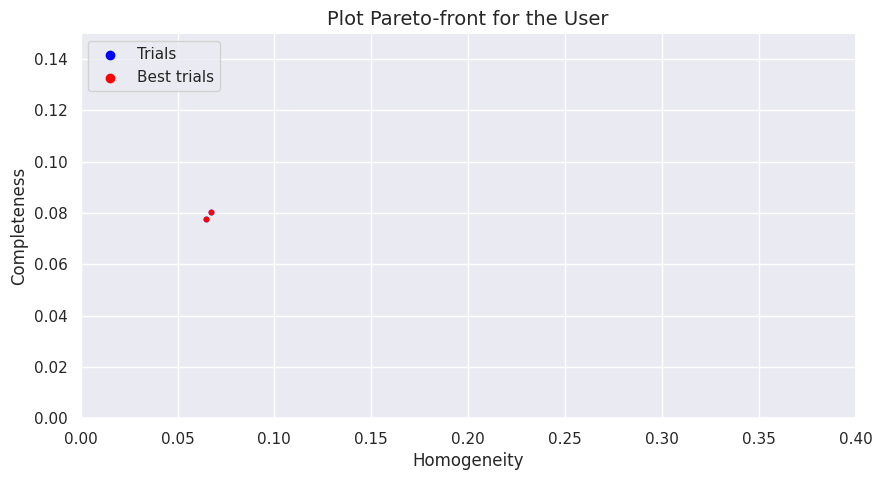

In [84]:
def pareto_front_user(study, accuracy_list, filename="pareto_front_user.png", path="."):
    df = study.trials_dataframe()

    # Verifica se o tamanho da lista de accuracy coincide com o número de trials
    if len(accuracy_list) != len(df):
        print("O tamanho da lista de accuracy não coincide com o número de trials.")
        return

    df['user_attrs_accuracy'] = accuracy_list

    sns.set_theme(style="darkgrid")

    # Plot pareto front
    plt.figure(figsize=(10, 5))
    plt.scatter(df['user_attrs_homogeneity_score'], df['user_attrs_completeness_score'], c='blue', cmap='coolwarm', s=10)  # Usar silhouette_score do user_attrs
    plt.xlim(0, 0.4)
    plt.ylim(0, 0.15)
    plt.xlabel('Homogeneity')
    plt.ylabel('Completeness')

    # Calcular as melhores trials com base nos valores mais elevados de v-measure para o user
    best_trials_system = df.nlargest(300, 'user_attrs_v_measure').index.tolist()

    for trial_idx in best_trials_system:
        plt.scatter(df.loc[trial_idx, 'user_attrs_homogeneity_score'], df.loc[trial_idx, 'user_attrs_completeness_score'], c='red', s=10, marker='o')

    plt.scatter([], [], color='blue', label='Trials', marker='o')
    plt.scatter([], [], color='red', label='Best trials', marker='o')

    plt.legend(loc='upper left', markerscale=1)
    plt.title("Plot Pareto-front for the User", fontsize=14)
    #plt.text(0.75, 1.02, "(threshold = 0)", horizontalalignment='center', verticalalignment='bottom', transform=plt.gca().transAxes, fontsize=8)

    plt.savefig(f'{path}/{filename}', dpi=300, bbox_inches='tight')

pareto_front_user(study_user, accuracy_list, filename="pareto_front_user_000.png", path="./")


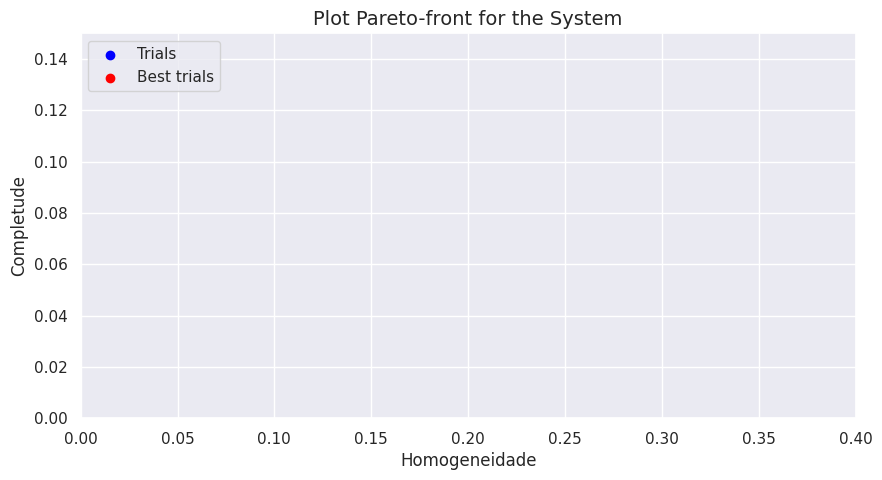

In [85]:
#SYSTEM
def pareto_front_system(study, accuracy_list, filename="pareto_front_system.png", path="."):
    df = study.trials_dataframe()

    # Verifica se o tamanho da lista de accuracy coincide com o número de trials
    if len(accuracy_list) != len(df):
        print("O tamanho da lista de accuracy não coincide com o número de trials.")
        return

    df['system_attrs_accuracy'] = accuracy_list

    sns.set_theme(style="darkgrid")

    # Plot pareto front
    plt.figure(figsize=(10, 5))
    plt.scatter(df['user_attrs_homogeneity_score'], df['user_attrs_completeness_score'], c='blue', cmap='coolwarm', s=10)  # Usando silhouette_score do user_attrs
    plt.xlim(0, 0.4)
    plt.ylim(0, 0.15)
    plt.xlabel('Homogeneidade')
    plt.ylabel('Completude')

    # Calcular as melhores trials com base nos valores mais elevados de v-measure para o system
    best_trials_system = df.nlargest(300, 'user_attrs_v_measure').index.tolist()

    for trial_idx in best_trials_system:
        plt.scatter(df.loc[trial_idx, 'user_attrs_homogeneity_score'], df.loc[trial_idx, 'user_attrs_completeness_score'], c='red', s=10, marker='o')

    plt.scatter([], [], color='blue', label='Trials', marker='o')
    plt.scatter([], [], color='red', label='Best trials', marker='o')

    plt.legend(loc='upper left', markerscale=1)
    plt.title("Plot Pareto-front for the System", fontsize=14)
    #plt.text(0.78, 1.02, "(threshold = 0)", horizontalalignment='center', verticalalignment='bottom', transform=plt.gca().transAxes, fontsize=8)

    plt.savefig(f'{path}/{filename}', dpi=300, bbox_inches='tight')

pareto_front_system(study_system, accuracy_list, filename="pareto_front_system_0.png", path="./")


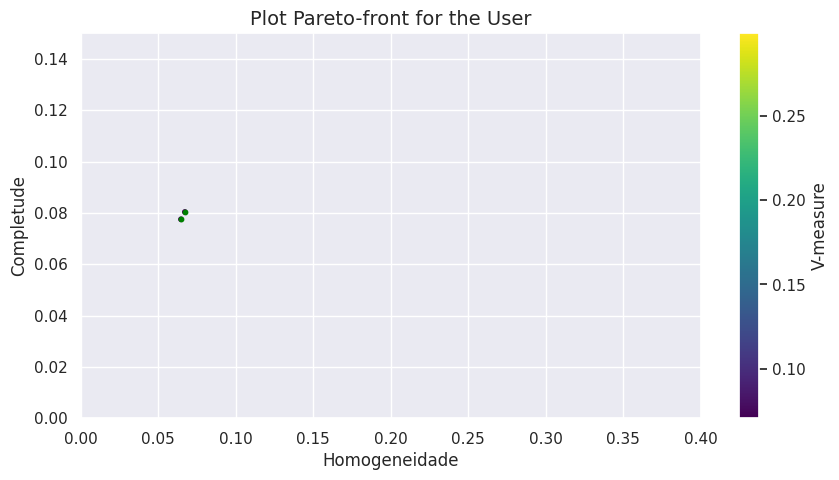

In [86]:
#Gráfico com intensidade da V-measure de lado - USER

def pareto_front(study, accuracy_list, filename="pareto_front.png", path="."):
    df = study.trials_dataframe()

    # Verifica se o tamanho das listas coincide com o número de trials
    if len(accuracy_list) != len(df):
        print("O tamanho das listas de accuracy e silhacc não coincide com o número de trials.")
        return

    df['user_attrs_accuracy'] = accuracy_list

    sns.set_theme(style="darkgrid")

    # Define um mapa de cores baseado na v-measure
    cmap = plt.get_cmap('viridis')
    norm = plt.Normalize(df['user_attrs_v_measure'].min(), df['user_attrs_v_measure'].max())

    # Plot pareto front
    plt.figure(figsize=(10, 5))
    plt.scatter(df['user_attrs_homogeneity_score'], df['user_attrs_completeness_score'], c=cmap(norm(df['user_attrs_v_measure'])), cmap='viridis', s=10)
    plt.xlim(0, 0.4)
    plt.ylim(0, 0.15)
    plt.xlabel('Homogeneidade')
    plt.ylabel('Completude')

    best_trials = df.nlargest(300, 'user_attrs_v_measure').index.tolist()

    for trial_idx in best_trials:
        plt.scatter(df.loc[trial_idx, 'user_attrs_homogeneity_score'], df.loc[trial_idx, 'user_attrs_completeness_score'], c='green', s=10, marker='o')

    plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), label='V-measure')
    plt.title("Plot Pareto-front for the User", fontsize=14)
    #plt.text(0.82, 1.02, "(threshold = 0)", horizontalalignment='center', verticalalignment='bottom', transform=plt.gca().transAxes, fontsize=8)

    plt.savefig(f'{path}/{filename}', dpi=300, bbox_inches='tight')

pareto_front(study_user, accuracy_list, filename="pareto_front_user_v_0", path="./")


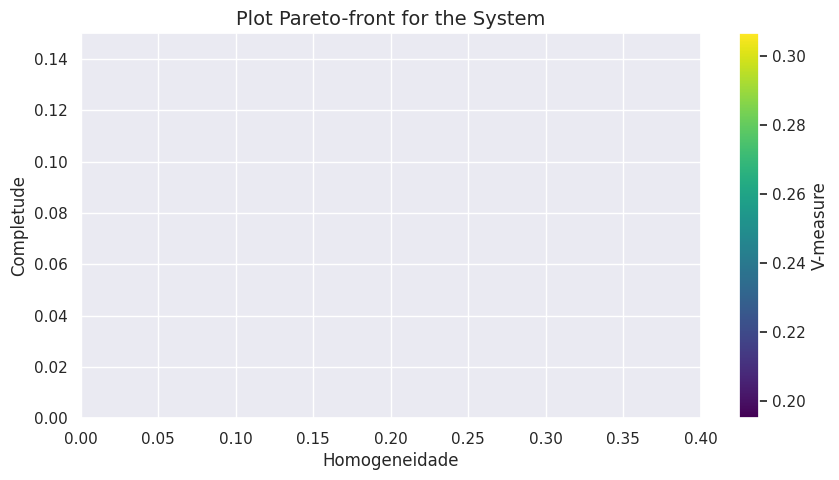

In [87]:
#Gráfico com intensidade da V-measure de lado - SYSTEM

def pareto_front(study, accuracy_list, silhacc_list, filename="pareto_front.png", path="."):
    df = study.trials_dataframe()

    # Verifica se o tamanho das listas coincide com o número de trials
    if len(accuracy_list) != len(df):
        print("O tamanho das listas de accuracy não coincide com o número de trials.")
        return

    df['user_attrs_accuracy'] = accuracy_list

    sns.set_theme(style="darkgrid")

    # Definir um mapa de cores baseado na v-measure
    cmap = plt.get_cmap('viridis')
    norm = plt.Normalize(df['user_attrs_v_measure'].min(), df['user_attrs_v_measure'].max())

    # Plot pareto front
    plt.figure(figsize=(10, 5))
    plt.scatter(df['user_attrs_homogeneity_score'], df['user_attrs_completeness_score'], c=cmap(norm(df['user_attrs_v_measure'])), cmap='viridis', s=10)
    plt.xlim(0, 0.4)
    plt.ylim(0, 0.15)
    plt.xlabel('Homogeneidade')
    plt.ylabel('Completude')

    # Calcular as melhores trials com base nos valores mais elevados de v-measure
    best_trials = df.nlargest(300, 'user_attrs_v_measure').index.tolist()

    for trial_idx in best_trials:
        plt.scatter(df.loc[trial_idx, 'user_attrs_homogeneity_score'], df.loc[trial_idx, 'user_attrs_completeness_score'], c='green', s=10, marker='o')


    plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), label='V-measure')
    plt.title("Plot Pareto-front for the System", fontsize=14)
    #plt.text(0.85, 1.02, "(threshold = 0)", horizontalalignment='center', verticalalignment='bottom', transform=plt.gca().transAxes, fontsize=8)

    plt.savefig(f'{path}/{filename}', dpi=300, bbox_inches='tight')

pareto_front(study_system, accuracy_list, silhacc_list, filename="pareto_front_sys_v_0", path="./")


Mean homogeneity: 0.38047915494664786
Mean completeness: 0.2053412407519526


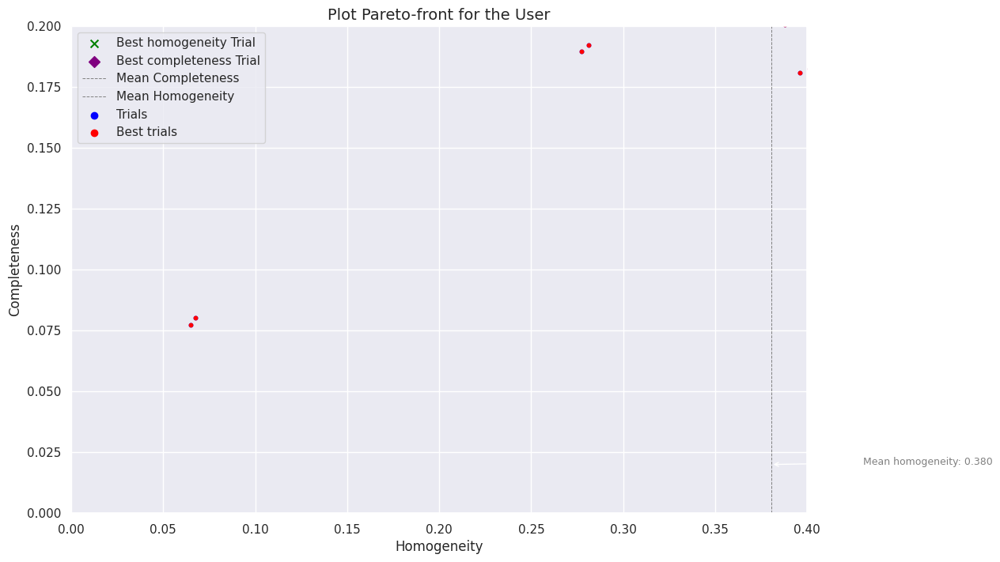

In [88]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def pareto_front_user(study, accuracy_list, filename="pareto_front_user.png", path="."):
    df = study.trials_dataframe()

    # Verifica se o tamanho da lista de accuracy coincide com o número de trials
    if len(accuracy_list) != len(df):
        print("O tamanho da lista de accuracy não coincide com o número de trials.")
        return

    # Atribui os valores de accuracy aos campos correspondentes no dataframe
    df['user_attrs_accuracy'] = accuracy_list

    sns.set_theme(style="darkgrid")

    # Calcular a média de accuracy e completeness_score
    mean_accuracy = df['user_attrs_homogeneity_score'].mean()
    mean_metric = df['user_attrs_completeness_score'].mean()

    # Plot pareto front
    plt.figure(figsize=(12, 8))
    plt.scatter(df['user_attrs_homogeneity_score'], df['user_attrs_completeness_score'], c='blue', cmap='coolwarm', s=10)  # Usar silhouette_score do user_attrs
    plt.xlim(0, 0.4)
    plt.ylim(0, 0.2)
    plt.xlabel('Homogeneity')
    plt.ylabel('Completeness')

    best_trials_system = df.nlargest(300, 'user_attrs_v_measure').index.tolist()

    for trial_idx in best_trials_system:
        plt.scatter(df.loc[trial_idx, 'user_attrs_homogeneity_score'], df.loc[trial_idx, 'user_attrs_completeness_score'], c='red', s=10, marker='o')

    best_accuracy_trial = df['user_attrs_homogeneity_score'].idxmax()
    plt.scatter(df.loc[best_accuracy_trial, 'user_attrs_homogeneity_score'], df.loc[best_accuracy_trial, 'user_attrs_completeness_score'], c='green', s=50, marker='x', label='Best homogeneity Trial')

    best_trial = df['user_attrs_completeness_score'].idxmax()
    plt.scatter(df.loc[best_trial, 'user_attrs_homogeneity_score'], df.loc[best_trial, 'user_attrs_completeness_score'], c='purple', s=50, marker='D', label='Best completeness Trial')

        # Adiciona as linhas das médias
    plt.axhline(y=mean_metric, color='gray', linestyle='--', linewidth=0.7, label='Mean Completeness')
    plt.axvline(x=mean_accuracy, color='gray', linestyle='--', linewidth=0.7, label='Mean Homogeneity')

    print(f"Mean homogeneity: {mean_accuracy}")
    print(f"Mean completeness: {mean_metric}")

    plt.annotate(f'Mean completeness: {mean_metric:.3f}', xy=(0.02, mean_metric), xytext=(0.02, mean_metric + 0.05),
                 arrowprops=dict(facecolor='black', arrowstyle='->'), fontsize=9, color='gray')
    plt.annotate(f'Mean homogeneity: {mean_accuracy:.3f}', xy=(mean_accuracy, 0.02), xytext=(mean_accuracy + 0.05, 0.02),
                 arrowprops=dict(facecolor='black', arrowstyle='->'), fontsize=9, color='gray')

    plt.scatter([], [], color='blue', label='Trials', marker='o')
    plt.scatter([], [], color='red', label='Best trials', marker='o')

    plt.legend(loc='upper left', markerscale=1)
    plt.title("Plot Pareto-front for the User", fontsize=14)
    #plt.text(0.71, 1.01, "(threshold = 0)", horizontalalignment='center', verticalalignment='bottom', transform=plt.gca().transAxes, fontsize=8)

    plt.savefig(f'{path}/{filename}', dpi=300, bbox_inches='tight')
    plt.show()

pareto_front_user(study_user, accuracy_list, filename="pareto_front_user_0.png", path="./")


Mean Homogeneity: 0.2772145420217548
Mean Completeness: 0.302273392448003


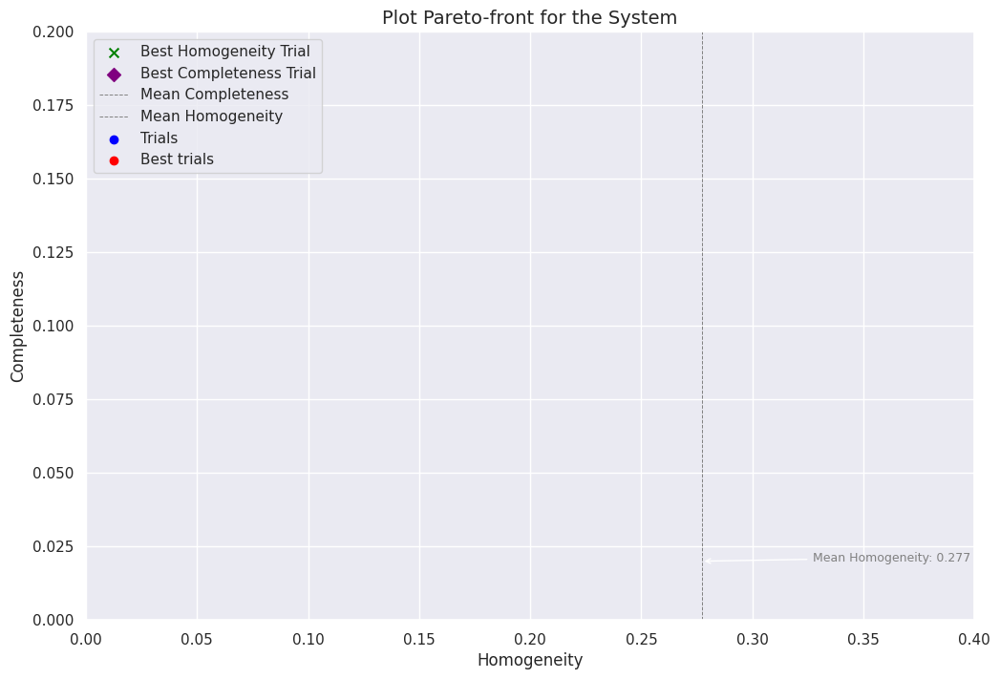

In [89]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def pareto_front_system(study, accuracy_list, filename="pareto_front_system.png", path="."):
    df = study.trials_dataframe()

    # Verifica se o tamanho da lista de accuracy coincide com o número de trials
    if len(accuracy_list) != len(df):
        print("O tamanho da lista de accuracy não coincide com o número de trials.")
        return

    # Atribui os valores de accuracy aos campos correspondentes no dataframe
    df['user_attrs_accuracy'] = accuracy_list

    sns.set_theme(style="darkgrid")

    # Calcular a média de accuracy e completeness_score
    mean_accuracy = df['user_attrs_homogeneity_score'].mean()
    mean_metric = df['user_attrs_completeness_score'].mean()

    # Plot pareto front
    plt.figure(figsize=(12, 8))
    plt.scatter(df['user_attrs_homogeneity_score'], df['user_attrs_completeness_score'], c='blue', cmap='coolwarm', s=10)  # Usar silhouette_score do user_attrs
    plt.xlim(0, 0.4)
    plt.ylim(0, 0.2)
    plt.xlabel('Homogeneity')
    plt.ylabel('Completeness')

    best_trials_system = df.nlargest(300, 'user_attrs_v_measure').index.tolist()

    for trial_idx in best_trials_system:
        plt.scatter(df.loc[trial_idx, 'user_attrs_homogeneity_score'], df.loc[trial_idx, 'user_attrs_completeness_score'], c='red', s=10, marker='o')

    best_accuracy_trial = df['user_attrs_homogeneity_score'].idxmax()
    plt.scatter(df.loc[best_accuracy_trial, 'user_attrs_homogeneity_score'], df.loc[best_accuracy_trial, 'user_attrs_completeness_score'], c='green', s=50, marker='x', label='Best Homogeneity Trial')

    best_completeness_trial = df['user_attrs_completeness_score'].idxmax()
    plt.scatter(df.loc[best_completeness_trial, 'user_attrs_homogeneity_score'], df.loc[best_completeness_trial, 'user_attrs_completeness_score'], c='purple', s=50, marker='D', label='Best Completeness Trial')

    # Adiciona as linhas das médias
    plt.axhline(y=mean_metric, color='gray', linestyle='--', linewidth=0.7, label='Mean Completeness')
    plt.axvline(x=mean_accuracy, color='gray', linestyle='--', linewidth=0.7, label='Mean Homogeneity')

    print(f"Mean Homogeneity: {mean_accuracy}")
    print(f"Mean Completeness: {mean_metric}")

    # Coloca as médias no gráfico
    plt.annotate(f'Mean Completeness: {mean_metric:.3f}', xy=(0.02, mean_metric), xytext=(0.02, mean_metric + 0.05),
                 arrowprops=dict(facecolor='black', arrowstyle='->'), fontsize=9, color='gray')
    plt.annotate(f'Mean Homogeneity: {mean_accuracy:.3f}', xy=(mean_accuracy, 0.02), xytext=(mean_accuracy + 0.05, 0.02),
                 arrowprops=dict(facecolor='black', arrowstyle='->'), fontsize=9, color='gray')

    plt.scatter([], [], color='blue', label='Trials', marker='o')
    plt.scatter([], [], color='red', label='Best trials', marker='o')

    plt.legend(loc='upper left', markerscale=1)
    plt.title("Plot Pareto-front for the System", fontsize=14)
    #plt.text(0.72, 1.01, "(threshold = 0)", horizontalalignment='center', verticalalignment='bottom', transform=plt.gca().transAxes, fontsize=8)

    plt.savefig(f'{path}/{filename}', dpi=300, bbox_inches='tight')
    plt.show()

pareto_front_system(study_system, accuracy_list, filename="pareto_front_system_0.png", path="./")


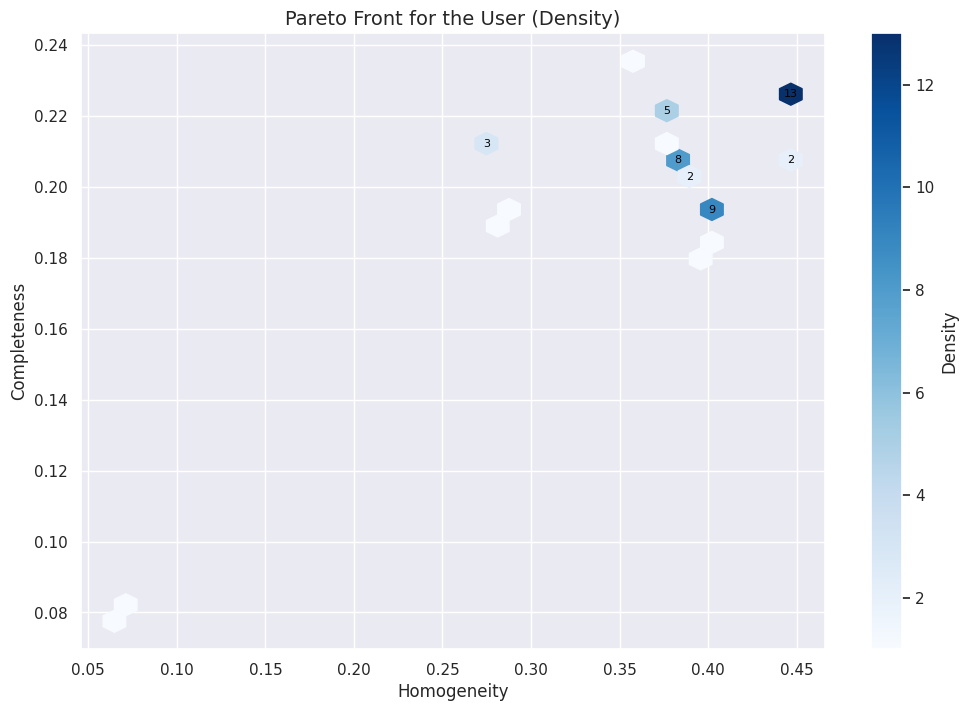

In [90]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def pareto_front_user_hexbin_with_annotations(study, accuracy_list, filename="pareto_front_user_hexbin_annotations.png", path="."):
    df = study.trials_dataframe()

    # Verifica se o tamanho da lista de accuracy coincide com o número de trials
    if len(accuracy_list) != len(df):
        print("O tamanho da lista de accuracy não coincide com o número de trials.")
        return

    # Atribui os valores de accuracy aos campos correspondentes no dataframe
    df['user_attrs_accuracy'] = accuracy_list

    plt.figure(figsize=(12, 8))

    # Cria o gráfico de hexbin
    hb = plt.hexbin(df['user_attrs_homogeneity_score'], df['user_attrs_completeness_score'], gridsize=30, cmap='Blues', mincnt=1)
    plt.colorbar(hb, label='Density')

    # Anotações no gráfico
    x, y = hb.get_offsets().T
    counts = hb.get_array()
    for count, x_coord, y_coord in zip(counts, x, y):
        if count > 1:  # Adiciona anotação apenas se há mais de 1 ponto
            plt.text(x_coord, y_coord, int(count), color='black', fontsize=8, ha='center', va='center')

    plt.xlabel('Homogeneity')
    plt.ylabel('Completeness')
    plt.title("Pareto Front for the User (Density)", fontsize=14)
    #plt.text(0.81, 1.01, "(threshold = 0)", horizontalalignment='center', verticalalignment='bottom', transform=plt.gca().transAxes, fontsize=8)
    plt.savefig(f'{path}/{filename}', dpi=300, bbox_inches='tight')
    plt.show()

pareto_front_user_hexbin_with_annotations(study_user, accuracy_list, filename="pareto_front_user_hexbin_annotations.png", path="./")


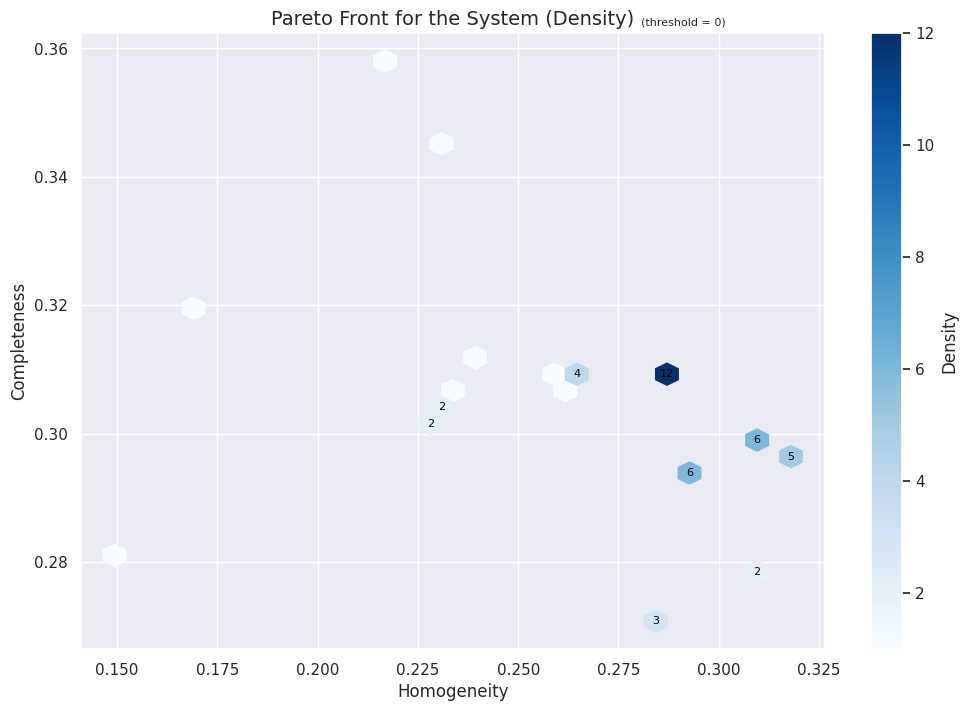

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def pareto_front_system_hexbin(study, accuracy_list, filename="pareto_front_system_hexbin_annotations.png", path="."):
    df = study.trials_dataframe()

    # Verifica se o tamanho da lista de accuracy coincide com o número de trials
    if len(accuracy_list) != len(df):
        print("O tamanho da lista de accuracy não coincide com o número de trials.")
        return

    # Atribui os valores de accuracy aos campos correspondentes no dataframe
    df['user_attrs_accuracy'] = accuracy_list

    plt.figure(figsize=(12, 8))

    # Cria o gráfico de hexbin
    hb = plt.hexbin(df['user_attrs_homogeneity_score'], df['user_attrs_completeness_score'], gridsize=30, cmap='Blues', mincnt=1)
    plt.colorbar(hb, label='Density')

    # Anotações no gráfico
    x, y = hb.get_offsets().T
    counts = hb.get_array()
    for count, x_coord, y_coord in zip(counts, x, y):
        if count > 1:  # Adiciona anotação apenas se há mais de 1 ponto
            plt.text(x_coord, y_coord, int(count), color='black', fontsize=8, ha='center', va='center')

    plt.xlabel('Homogeneity')
    plt.ylabel('Completeness')
    plt.title("Pareto Front for the System (Density)", fontsize=14)
    plt.text(0.81, 1.01, "(threshold = 0)", horizontalalignment='center', verticalalignment='bottom', transform=plt.gca().transAxes, fontsize=8)
    plt.savefig(f'{path}/{filename}', dpi=300, bbox_inches='tight')
    plt.show()

pareto_front_system_hexbin(study_system, accuracy_list, filename="pareto_front_system_hexbin_annotations.png", path="./")
